## Overview

This Jupyter Notebook processes and analyzes behavioral data from CSV files. The workflow includes loading data, applying transformations, removing outliers, calculating various metrics, and visualizing the results through plots.

## Workflow Summary

1. **Import Libraries**: Import necessary libraries such as `pandas`, `numpy`, `matplotlib`, `seaborn`, and others.
2. **Set Default Image Parameters**: Define global parameters for consistent plotting styles.
3. **Load Data**: Load CSV files containing behavioral data.
4. **Data Transformation**:
    - Calculate medians for specific coordinates.
    - Apply homography transformation to correct coordinates.
    - Remove outliers based on defined criteria.
5. **Calculate Metrics**:
    - Calculate wall/total ratio for different phases.
    - Calculate total distance traveled and average speed.
6. **Visualization**:
    - Plot occupation heatmaps.
    - Plot 3D speed trajectories.
    - Plot box plots for distance and speed by group.
    - Plot scatter plots for wall/total ratio and time in center across phases.
7. **Statistical Analysis**:
    - Perform two-way ANOVA to analyze the effect of group and phase on distance and speed.

## How to Use

1. **Set Directory Path**: Update the `directory` variable with the path to your CSV files.
2. **Run the Notebook**: Execute the cells sequentially to process the data and generate plots.
3. **View Results**: The results will be displayed as plots within the notebook and saved as CSV files for further analysis.

## Key Variables

- `bin_size`: Integer value representing the bin size for downsampling data.
- `combined_df_corrected`: DataFrame containing corrected coordinates and other metrics.
- `delta_df`: DataFrame containing total distance and speed metrics for different phases.
- `directory`: String value representing the path to the directory containing CSV files.
- `frame_rate`: Integer value representing the frame rate of the video.
- `phase`: String value representing the phase to be analyzed (e.g., 'total', 'stim').
- `wall_ratio_df`: DataFrame containing wall/total ratio and time in center metrics for different phases.

## Output Files

- `phase_ratios_results.csv`: Contains wall/total ratio results for different phases.
- `total_delta_results.csv`: Contains total distance and speed metrics for different phases.
- `combined_corrected_data.csv`: Contains combined corrected data for all files.




In [ ]:
# V0
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2  # OpenCV library
from scipy.ndimage import gaussian_filter # For heatmap smoothing
from mpl_toolkits.mplot3d import Axes3D
# time check 
def default_img_set():
    import matplotlib as mpl 

    mpl.rcParams['interactive'] = True

    # figure
    mpl.rcParams['figure.frameon'] = False
    mpl.rcParams['figure.titleweight'] = 'regular'
    mpl.rcParams['figure.titlesize'] = 'xx-large'
    mpl.rcParams['figure.autolayout'] = True
    mpl.rcParams['figure.facecolor'] = 'w'
    mpl.rcParams['figure.edgecolor'] = 'None'
    mpl.rcParams['savefig.dpi'] = 300
    mpl.rcParams['savefig.format'] = 'pdf'
    mpl.rcParams['savefig.facecolor'] = 'None'
    mpl.rcParams['savefig.edgecolor'] = 'None'
    mpl.rcParams['savefig.bbox'] = 'tight'
    mpl.rcParams['pdf.fonttype'] = 42
    mpl.rcParams['ps.fonttype'] = 42
    mpl.rcParams['svg.fonttype'] = 'none'

    # axes
    mpl.rcParams['axes.facecolor'] = 'None'
    mpl.rcParams['axes.labelweight'] = 'bold'
    mpl.rcParams['axes.labelsize'] = 'x-large'
    mpl.rcParams['axes.titleweight'] = 'regular'
    mpl.rcParams['axes.titlesize'] = 'xx-large'
    mpl.rcParams['axes.linewidth'] = 1
    mpl.rcParams['axes.unicode_minus'] = False
    mpl.rcParams['xtick.major.width'] = 1
    mpl.rcParams['xtick.major.size'] = 5
    mpl.rcParams['xtick.labelsize'] = 'large'
    mpl.rcParams['ytick.major.width'] = 1
    mpl.rcParams['ytick.major.size'] = 5
    mpl.rcParams['ytick.labelsize'] = 'large'
    mpl.rcParams['lines.linewidth'] = 2
    mpl.rcParams['axes.spines.right'] = False
    mpl.rcParams['axes.spines.top'] = False
    # Character
    mpl.rcParams['font.family'] = 'sans-serif'
    mpl.rcParams['font.sans-serif'] = 'Arial'
    mpl.rcParams['font.weight'] = 'bold'
    # legend
    mpl.rcParams['legend.frameon'] = False

# Define global parameters
frame_rate = 25
bin_size = 3
phase = 'total' # Phase can be 'stim' or 'total'. This defines phases plotted on heatmaps and 3d trajectory maps.

def load_data(file_path):
    # Extract the file name from the file path
    file_name = file_path.split('/')[-1]  # Adjust this based on path format
    
    df = pd.read_csv(file_path)
    df.columns = df.iloc[0] + df.iloc[1]  # Handle double-row headers
    df = df.drop(df.index[0:2])  # Drop first two rows
    df.columns.values[0] = 'frame'  # Rename the first column to 'frame'
    
    # Convert 'frame' column to numeric, replacing non-numeric values with NaN
    df['frame'] = pd.to_numeric(df['frame'], errors='coerce')
    
    # Convert all columns containing 'likelihood' in the name to numeric
    likelihood_cols = [col for col in df.columns if 'likelihood' in col]
    df[likelihood_cols] = df[likelihood_cols].apply(pd.to_numeric, errors='coerce')
    
    # Remove rows with NaN in the 'frame' column
    df = df.dropna(subset=['frame'])
    
    # Add a column for the file name
    df['file_name'] = file_name
    
    # Reset the index after dropping rows
    df = df.reset_index(drop=True)
    
    return df

# Function to calculate the median of each corner's coordinates
def calculate_medians(df):
    medians = {
        'topleftcornerx_median': df['topleftcornerx'].median(),
        'topleftcornery_median': df['topleftcornery'].median(),
        'toprightcornerx_median': df['toprightcornerx'].median(),
        'toprightcornery_median': df['toprightcornery'].median(),
        'bottomleftcornerx_median': df['bottomleftcornerx'].median(),
        'bottomleftcornery_median': df['bottomleftcornery'].median(),
        'bottomrightcornerx_median': df['bottomrightcornerx'].median(),
        'bottomrightcornery_median': df['bottomrightcornery'].median()
    }
    return pd.DataFrame([medians])


# Function to compute homography and apply it to the body part coordinates
def apply_homography(df, medians_df):
    source_points = np.array([
        [medians_df.iloc[:, 0], medians_df.iloc[:, 1]],
        [medians_df.iloc[:, 2], medians_df.iloc[:, 3]],
        [medians_df.iloc[:, 4], medians_df.iloc[:, 5]],
        [medians_df.iloc[:, 6], medians_df.iloc[:, 7]]
    ])

    # Mapping onto a 500*500 scale
    destination_points = np.array([
        [0, 0],         # Top-left (0, 0)
        [50, 0],       # Top-right (500, 0)
        [0, 50],       # Bottom-left (0, 500)
        [50, 50]      # Bottom-right (500, 500)
    ])

    homography_matrix, _ = cv2.findHomography(source_points, destination_points)

    def transform_coordinates(row):
        point = np.array([[row['bodycenterx'], row['bodycentery']]], dtype='float32')
        point = np.array([point])  # Reshape for homography
        transformed_point = cv2.perspectiveTransform(point, homography_matrix)
        return pd.Series([transformed_point[0][0][0], transformed_point[0][0][1]])

    df_corrected = df.copy()
    df_corrected[['corrected_x', 'corrected_y']] = df_corrected.apply(transform_coordinates, axis=1)
    return df_corrected

###
def outlier_removal(df):
    # Calculate the quantiles for corrected_x and corrected_y
    x_lower_bound, x_upper_bound = df['corrected_x'].quantile([0.005, 0.995])
    y_lower_bound, y_upper_bound = df['corrected_y'].quantile([0.005, 0.995])

    # Define a function to replace outliers or low likelihood with the previous non-outlier value
    def replace_with_previous_non_outlier(df, lower_x, upper_x, lower_y, upper_y):
        for i in range(1, len(df)):
            # Check for outliers in corrected_x or corrected_y
            is_x_outlier = df['corrected_x'].iloc[i] < lower_x or df['corrected_x'].iloc[i] > upper_x
            is_y_outlier = df['corrected_y'].iloc[i] < lower_y or df['corrected_y'].iloc[i] > upper_y
            
            # Check if bodycenterlikelihood is smaller than 0.6
            is_low_likelihood = df['bodycenterlikelihood'].iloc[i] < 0.6

            # Replace 'corrected_x' if it's an outlier or if likelihood is low
            if is_x_outlier or is_low_likelihood:
                df['corrected_x'].iloc[i] = df['corrected_x'].iloc[i - 1]

            # Replace 'corrected_y' if it's an outlier or if likelihood is low
            if is_y_outlier or is_low_likelihood:
                df['corrected_y'].iloc[i] = df['corrected_y'].iloc[i - 1]

        return df

    # Apply the function to replace outliers and low-likelihood values
    df_corrected = replace_with_previous_non_outlier(df.copy(), x_lower_bound, x_upper_bound, y_lower_bound, y_upper_bound)

    return df_corrected


# Function to calculate the wall/total ratio for a specific phase
def calculate_phase_wt_ratio(df, start_frame, end_frame):
    phase_data = df[(df['frame'] >= start_frame) & (df['frame'] < end_frame)]
    wall_count = len(phase_data[phase_data['wc'] == 0])
    center_count = len(phase_data[phase_data['wc'] == 1])
    center_time = center_count/frame_rate
    total_count = len(phase_data)
    if total_count == 0:
        return float('nan')
    return wall_count / total_count, center_time

# time check


import matplotlib.patches as patches

def plot_occupation_heatmap(df_corrected, mouse_name, phase='stim', pre_phase_end=3000, stimulus_phase_end=8250, bins=200, arena_size=50, std_dev=4.0, dpi=150, mouse_diameter=5, vmax_ratio=0.01):
    """
    Plots an occupation probability density heatmap of the mouse's movement in the arena, with Gaussian smoothing,
    and represents the mouse as a circle of 7 cm diameter in a 50cm x 50cm arena.
    
    :param df_corrected: DataFrame containing corrected X and Y coordinates.
    :param mouse_name: Name of the mouse for labeling.
    :param phase: Specify 'total' to plot the entire session or 'stim' for stimulus phase only.
    :param pre_phase_end: The frame number where the pre-phase ends.
    :param stimulus_phase_end: The frame number where the stimulus phase ends.
    :param bins: Number of bins to divide the arena (default: 200x200 grid).
    :param arena_size: Size of the arena in cm (default: 50x50 cm).
    :param std_dev: Standard deviation for Gaussian smoothing (default: 4.0).
    :param dpi: Dots per inch for the plot resolution (default: 150).
    :param mouse_diameter: Diameter of the mouse in cm (default: 7 cm).
    :param vmax_ratio: Ratio for the upper limit of the color scale, default is 1% of the total time.
    """
    plt.figure()
    # Filter data based on the phase
    if phase == 'stim':
        df_phase = df_corrected[(df_corrected['frame'] >= pre_phase_end) & (df_corrected['frame'] < stimulus_phase_end)]
        title_suffix = "(Stimulus Phase)"
    else:
        df_phase = df_corrected
        title_suffix = "(Total Phase)"
    
    # Calculate total number of frames
    total_frames = len(df_phase)
    
    # Initialize an empty heatmap
    heatmap = np.zeros((bins, bins))
    
    # Define the bin edges
    xedges = np.linspace(0, arena_size, bins + 1)
    yedges = np.linspace(0, arena_size, bins + 1)

    # Iterate over each row in df_phase and add a 7cm circle to the heatmap
    for index, row in df_phase.iterrows():
        x = row['corrected_x']
        y = row['corrected_y']
        
        # Calculate which bin the circle falls into
        x_bin = np.digitize(x, xedges) - 1
        y_bin = np.digitize(y, yedges) - 1
        
        # Add the 7cm diameter (converted to bins) to the heatmap
        radius_bins = int((mouse_diameter / arena_size) * bins / 2)
        for i in range(max(0, x_bin - radius_bins), min(bins, x_bin + radius_bins + 1)):
            for j in range(max(0, y_bin - radius_bins), min(bins, y_bin + radius_bins + 1)):
                distance = np.sqrt((i - x_bin)**2 + (j - y_bin)**2)
                if distance <= radius_bins:
                    heatmap[i, j] += 1

    # Normalize the heatmap to convert it to a probability density (i.e., divide by the total frames)
    heatmap_density = heatmap / total_frames

    # Apply Gaussian smoothing to the probability density heatmap
    heatmap_smooth = gaussian_filter(heatmap_density, sigma=std_dev)
    
    # Plot the smoothed heatmap using imshow with a set vmax that represents 1% of the total time
    plt.figure(dpi=dpi)
    img = plt.imshow(heatmap_smooth.T, origin='upper', cmap='inferno', extent=[0, arena_size, 0, arena_size], 
                    aspect='equal', vmin=0, vmax=vmax_ratio)  # Set vmin and vmax

    # Set the x and y ticks for 50 x 50 cm grid
    tick_positions = np.linspace(0, arena_size, num=6)  # 6 ticks from 0 to 50 cm
    tick_labels = np.linspace(0, 50, num=6)  # Scale to 0 to 50 cm

    plt.xticks(tick_positions, tick_labels)  # Set x-axis tick positions and labels
    plt.yticks(tick_positions, tick_labels)  # Set y-axis tick positions and labels
    
    # Add labels and title
    plt.title(f"{title_suffix}: {mouse_name}")
    plt.xlabel('X Position (cm)')
    plt.ylabel('Y Position (cm)')
    
    # Create a colorbar that reflects the occupation density
    cbar = plt.colorbar(img)
    cbar.set_label('Probability Density')

    plt.tight_layout()
    plt.show()
    
# Modified function to process a single CSV file
def process_file(file_path):
    print(f"Processing {file_path}...")
    df = load_data(file_path)
    # Extract short mouse name for plotting
    mouse_name = os.path.splitext(os.path.basename(file_path))[0]
    mouse_name = mouse_name.split('_')[0]  # Adjust split criteria as needed

    medians_df = calculate_medians(df)
    df_corrected = apply_homography(df, medians_df)
    df_corrected = outlier_removal(df_corrected)
    
    # Calculate wc (wall/center) for each frame
    df_corrected['wc'] = df_corrected.apply(lambda row: 1 if 12.5 < row['corrected_x'] < 37.5 and 12.5 < row['corrected_y'] < 37.5 else 0, axis=1)
    
    # Define frame ranges for each phase
    pre_phase_end = 3000
    stimulus_phase_end = pre_phase_end + 5250

    # Calculate wall/total ratios for each phase
    pre_ratio, pre_center = calculate_phase_wt_ratio(df_corrected, 0, pre_phase_end)
    stimulus_ratio, stim_center = calculate_phase_wt_ratio(df_corrected, pre_phase_end, stimulus_phase_end)
    post_ratio, post_center = calculate_phase_wt_ratio(df_corrected, stimulus_phase_end, df_corrected['frame'].max())

    # Create a dictionary with the results
    result = {
        'file_name': os.path.basename(file_path),
        'pre_phase_ratio': pre_ratio,
        'stimulus_phase_ratio': stimulus_ratio,
        'post_phase_ratio': post_ratio,
        'pre_center': pre_center,
        'stim_center': stim_center,
        'post_center': post_center
    }

    # Call the function to plot the heatmap
    mouse_name = os.path.basename(file_path)
    plot_occupation_heatmap(df_corrected, mouse_name, phase=phase)

    # # Call the function to plot the 3D speed over time and coordinates
    # plot_speed_3d(df_corrected, mouse_name, frame_rate=25, pre_phase_end=3000, stimulus_phase_end=8250, phase='stim')

    return df_corrected, result


# Function to calculate the total distance traveled and average speed with smoothing
def calculate_delta(df, start_frame=None, end_frame=None, bin_size=3, frame_rate=25, smoothing_window=3):
    """
    Calculate the total distance traveled and smoothed average speed, considering every `bin_size` frames.

    :param df: DataFrame containing the 'frame', 'corrected_x', and 'corrected_y' columns.
    :param start_frame: Start frame for the phase (optional).
    :param end_frame: End frame for the phase (optional).
    :param bin_size: Frame bin size to downsample the data (default: 3).
    :param frame_rate: Frame rate of the video (default: 25 frames per second).
    :param smoothing_window: Window size for smoothing the speed (default: 3).
    
    :return: Total distance and smoothed average speed.
    """
    # If start_frame and end_frame are provided, calculate for the specified phase
    if start_frame is not None and end_frame is not None:
        df = df[(df['frame'] >= start_frame) & (df['frame'] < end_frame)]
    
    # Select every 'bin_size' row (downsampling)
    df = df.iloc[::bin_size]
    
    # Calculate the Euclidean distance between consecutive selected frames
    df['distance'] = np.sqrt((df['corrected_x'].diff()**2) + (df['corrected_y'].diff()**2))
    
    # Calculate the speed: distance / (bin_size/frame_rate) seconds
    df['speed'] = df['distance'] / (bin_size / frame_rate)  # Time interval for every 'bin_size' frames
    
    # Apply smoothing to the speed values using a rolling window
    df['smoothed_speed'] = df['speed'].rolling(window=smoothing_window, min_periods=1).mean()
    
    # Sum the distances, ignoring NaN values
    total_distance = df['distance'].sum(skipna=True)
    
    # Calculate the average smoothed speed, ignoring NaN values
    average_smoothed_speed = df['smoothed_speed'].mean(skipna=True)
    
    return total_distance, average_smoothed_speed, df



def plot_speed_3d(df_corrected, mouse_name, frame_rate=25, pre_phase_end=3000, stimulus_phase_end=8250, phase='stim',height_scale=3):
    """
    Plots a 3D trajectory of the mouse's speed over time and space, adjusted for top-left corner origin.
    
    :param df_corrected: DataFrame containing corrected X, Y coordinates and speed.
    :param mouse_name: Name of the mouse for labeling.
    :param frame_rate: Frame rate of the video (default: 25 fps).
    :param pre_phase_end: The frame number where the pre-phase ends.
    :param stimulus_phase_end: The frame number where the stimulus phase ends.
    :param phase: Specify 'total' to plot the entire session or 'stim' for stimulus phase only.
    """
    plt.figure()
    # Filter data based on the phase
    if phase == 'stim':
        df_phase = df_corrected[(df_corrected['frame'] >= pre_phase_end) & (df_corrected['frame'] < stimulus_phase_end)]
        title_suffix = "(Stimulus Phase)"
    else:
        df_phase = df_corrected
        title_suffix = "(Total Phase)"
    
    # Calculate time in minutes (from frames)
    df_phase['time_min'] = df_phase['frame'] / (frame_rate * 60)  # Convert frames to minutes


    # Create 3D plot
    fig = plt.figure(dpi=150)

    ax = fig.add_subplot(111, projection='3d')
    ax.set_box_aspect(aspect = (1,1,height_scale))

    # Stretch the plot
    # ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([0.3, 0.3, 1, 1]))

    # Plot 3D trajectory of the mouse’s speed over time and coordinates
    sc = ax.scatter(df_phase['corrected_x'], df_phase['corrected_y'], df_phase['time_min'], 
                    c=df_phase['smoothed_speed'], cmap='coolwarm', s=10, marker='o')
    
    # # To connect dots by lines.
    # ax.plot(df_phase['corrected_x'], df_phase['corrected_y'], df_phase['time_min'], 
    #                 color='blue', linewidth=1, alpha=0.7) 
    
    # Add color bar for speed
    cbar = plt.colorbar(sc, ax=ax, pad=0.1,shrink=0.7)
    cbar.set_label('Speed (cm/s)')

    # Set axis labels
    ax.set_xlabel('X (cm)')
    ax.set_ylabel('Y (cm)')
    ax.set_zlabel('Time (mins)')

    # Flip the Y-axis to ensure the top-left corner is the origin
    ax.invert_yaxis()
    # ax.invert_xaxis()

    # Set plot title
    ax.set_title(f"{title_suffix}: {mouse_name}")

    # Set grid for better visualization
    ax.grid(True)
    # ax.view_init(elev=45, azim=30)  # Set the viewing angle


    # Display the plot
    plt.tight_layout()
    plt.show()

# Function to extract group from filename
def get_group(filename):
    if 'Gt' in filename:
        return 'Gt'
    elif 'Cn' in filename:
        return 'Cn'
    return 'Unknown'

# Function to calculate mean heatmap for a group, accounting for mouse size
def calculate_mean_heatmap(df_list, arena_size=50, bins=100, mouse_diameter=7):
    """
    Calculate mean heatmap from multiple DataFrames, accounting for mouse size.
    
    :param df_list: List of DataFrames containing corrected coordinates.
    :param arena_size: Size of the arena in cm (default: 50 cm).
    :param bins: Number of bins for the histogram (default: 100x100 grid).
    :param mouse_diameter: Diameter of the mouse in cm (default: 7 cm).
    :return: Mean heatmap array.
    """
    plt.figure()
    all_heatmaps = []
    
    # Define the bin edges
    xedges = np.linspace(0, arena_size, bins + 1)
    yedges = np.linspace(0, arena_size, bins + 1)
    
    # Convert mouse diameter to bin units
    radius_bins = int((mouse_diameter / arena_size) * bins / 2)
    
    for df in df_list:
        # Initialize empty heatmap
        heatmap = np.zeros((bins, bins))
        
        # Iterate over each row in DataFrame and add a 7cm circle to the heatmap
        for index, row in df.iterrows():
            x = row['corrected_x']
            y = row['corrected_y']
            
            # Calculate which bin the circle falls into
            x_bin = np.digitize(x, xedges) - 1
            y_bin = np.digitize(y, yedges) - 1
            
            # Add the 7cm diameter (converted to bins) to the heatmap
            for i in range(max(0, x_bin - radius_bins), min(bins, x_bin + radius_bins + 1)):
                for j in range(max(0, y_bin - radius_bins), min(bins, y_bin + radius_bins + 1)):
                    distance = np.sqrt((i - x_bin)**2 + (j - y_bin)**2)
                    if distance <= radius_bins:
                        heatmap[i, j] += 1
        
        # Normalize the heatmap
        heatmap_density = heatmap / len(df)
        all_heatmaps.append(heatmap_density)
    
    # Calculate mean heatmap
    mean_heatmap = np.mean(all_heatmaps, axis=0)
    return mean_heatmap

# Function to plot mean heatmap with mouse size and percent of total time
def plot_mean_occupation_heatmap(group_dfs, group_name, phase='stim', pre_phase_end=3000, 
                                 stimulus_phase_end=8250, bins=200, arena_size=50, 
                                 std_dev=4.0, dpi=150, mouse_diameter=7, vmax_ratio=0.01):
    """
    Plot mean occupation heatmap for a group with Gaussian smoothing and 
    mouse size represented as a circle. Color scale is in percentage of total time.
    """
    plt.figure()
    # Filter data based on phase for all DataFrames
    if phase == 'stim':
        group_dfs_phase = [df[(df['frame'] >= pre_phase_end) & 
                              (df['frame'] < stimulus_phase_end)] 
                           for df in group_dfs]
        title_suffix = "(Stimulus Phase)"
    else:
        group_dfs_phase = group_dfs
        title_suffix = "(Total Phase)"
    
    # Calculate mean heatmap
    mean_heatmap = calculate_mean_heatmap(group_dfs_phase, arena_size, bins, mouse_diameter)
    
    # Apply Gaussian smoothing
    heatmap_smooth = gaussian_filter(mean_heatmap, sigma=std_dev)
    
    # Apply log-scaling
    heatmap_log_scaled = np.arcsinh(heatmap_smooth)
    
    # Create plot
    plt.figure(dpi=dpi)
    img = plt.imshow(heatmap_log_scaled.T, origin='upper', cmap='inferno',
                     extent=[0, arena_size, 0, arena_size], aspect='equal', vmin=0, vmax=vmax_ratio)
    
    # Set ticks for 50 x 50 cm grid
    tick_positions = np.linspace(0, arena_size, num=6)
    tick_labels = np.linspace(0, 50, num=6)
    plt.xticks(tick_positions, tick_labels)
    plt.yticks(tick_positions, tick_labels)
    
    # Add labels and title
    plt.title(f"{title_suffix}: {group_name}")
    plt.xlabel('X Position (cm)')
    plt.ylabel('Y Position (cm)')
    
    # Add colorbar to reflect percentage of total time
    cbar = plt.colorbar(img)
    cbar.set_label('Probability Density')
    
    # Adjust colorbar ticks for unscaled values
    tick_values = cbar.get_ticks()
    cbar.set_ticks(tick_values)
    cbar.set_ticklabels(np.sinh(tick_values).round(4))
    
    plt.tight_layout()
    plt.show()

# Modified function to process all CSV files in a directory
def process_directory(directory_path, frame_rate=25):
    default_img_set()

    # Initialize group dictionaries
    group_data = {
        'Gt': [],
        'Cn': []
    }
    
    results = []
    delta = []
    all_df_corrected = []
    for file_name in os.listdir(directory_path):
        if file_name.endswith('.csv'):
            file_path = os.path.join(directory_path, file_name)
            df_corrected, result = process_file(file_path)
            
            # Add group information
            group = get_group(file_name)
            df_corrected['group'] = group
            result['group'] = group
            
            # Store DataFrame in appropriate group list
            group_data[group].append(df_corrected)
            
            # Calculate total distance for all frames
            total_distance, total_speed, df_corrected = calculate_delta(df_corrected)

            # Calculate total distance for pre phase (0 to 3000 frames)
            distance_pre_phase, pre_speed, _ = calculate_delta(df_corrected, 0, 3000)
            
            # Calculate total distance for stimulus phase (3000 to 8250 frames)
            distance_stimulus_phase, stim_speed, _ = calculate_delta(df_corrected, 3000, 8250)

            # Calculate total distance for pre phase (0 to 3000 frames)
            distance_post_phase, post_speed, _ = calculate_delta(df_corrected, 8250, 12000)      

            # Append results
            result['total_distance'] = total_distance
            result['distance_pre_phase'] = distance_pre_phase
            result['distance_stimulus_phase'] = distance_stimulus_phase
            result['distance_post_phase'] = distance_post_phase
            results.append(result)
            
            # Append to distances DataFrame
            delta.append({
                'file_name': result['file_name'], 
                'total_distance': total_distance, 
                'distance_pre_phase': distance_pre_phase,
                'distance_stimulus_phase': distance_stimulus_phase,
                'distance_post_phase': distance_post_phase,
                'speed_total': total_speed,
                'speed_pre': pre_speed,
                'speed_stim': stim_speed,
                'speed_post': post_speed
            })
            
            # Add file_name column to df_corrected and append to all_df_corrected
            df_corrected['file_name'] = result['file_name']
            
            # Add sec column to df_corrected (frame // frame_rate)
            df_corrected['sec'] = (df_corrected['frame'] // frame_rate).astype(int)
            # Call the function to plot the 3D speed over time and coordinates
            mouse_name = os.path.basename(file_path)
            plot_speed_3d(df_corrected, mouse_name, frame_rate=25, pre_phase_end=3000, stimulus_phase_end=8250, phase=phase)
            all_df_corrected.append(df_corrected)
    
    # Create DataFrames from the results
    wall_ratio_df = pd.DataFrame(results)
    delta_df = pd.DataFrame(delta)
    
    # Concatenate all df_corrected DataFrames
    combined_df_corrected = pd.concat(all_df_corrected, ignore_index=True)
    
    # Plot mean heatmaps for each group
    for group_name, group_dfs in group_data.items():
        if group_dfs:  # Check if group has any data
            plot_mean_occupation_heatmap(group_dfs, group_name, phase=phase)

    # Save the results to CSV files
    wall_ratio_df.to_csv('phase_ratios_results.csv', index=False)
    delta_df.to_csv('total_delta_results.csv', index=False)
    combined_df_corrected.to_csv('combined_corrected_data.csv', index=False)
    
    print("Results saved to 'phase_ratios_results.csv', 'total_delta_results.csv', and 'combined_corrected_data.csv'")
    return wall_ratio_df, delta_df, combined_df_corrected

# Main function to start processing
if __name__ == "__main__":
    directory = '/Users/apple/Desktop/Patriarchi_Lab/OF2'  # Replace with the correct path
    wall_ratio_df, delta_df, combined_df_corrected = process_directory(directory)
    print(wall_ratio_df)  # Display the wall ratio results DataFrame
    print(delta_df)  # Display the total delta DataFrame
    print(combined_df_corrected.head())    # Display the combined corrected DataFrame

Processing /Users/apple/Desktop/Patriarchi_Lab/OF2/QPCn1pl.csv...


/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/1470462236.py:148: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_x'].iloc[i] = df['corrected_x'].iloc[i - 1]
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/1470462236.py:152: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_y'].iloc[i] = df['corrected_y'].iloc[i - 1]


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/apple/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/1470462236.py", line 616, in <module>
    wall_ratio_df, delta_df, combined_df_corrected = process_directory(directory)
                                                     ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/1470462236.py", line 541, in process_directory
    df_corrected, result = process_file(file_path)
                           ^^^^^^^^^^^^^^^^^^^^^^^
  File "/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/1470462236.py", line 271, in process_file
    df_corrected = outlier_removal(df_corrected)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/1470462236

Processing /Users/apple/Desktop/Patriarchi_Lab/OF2/QPCn1pl.csv...


/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:150: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_x'].iloc[i] = df['corrected_x'].iloc[i - 1]
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:154: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_y'].iloc[i] = df['corrected_y'].iloc[i - 1]


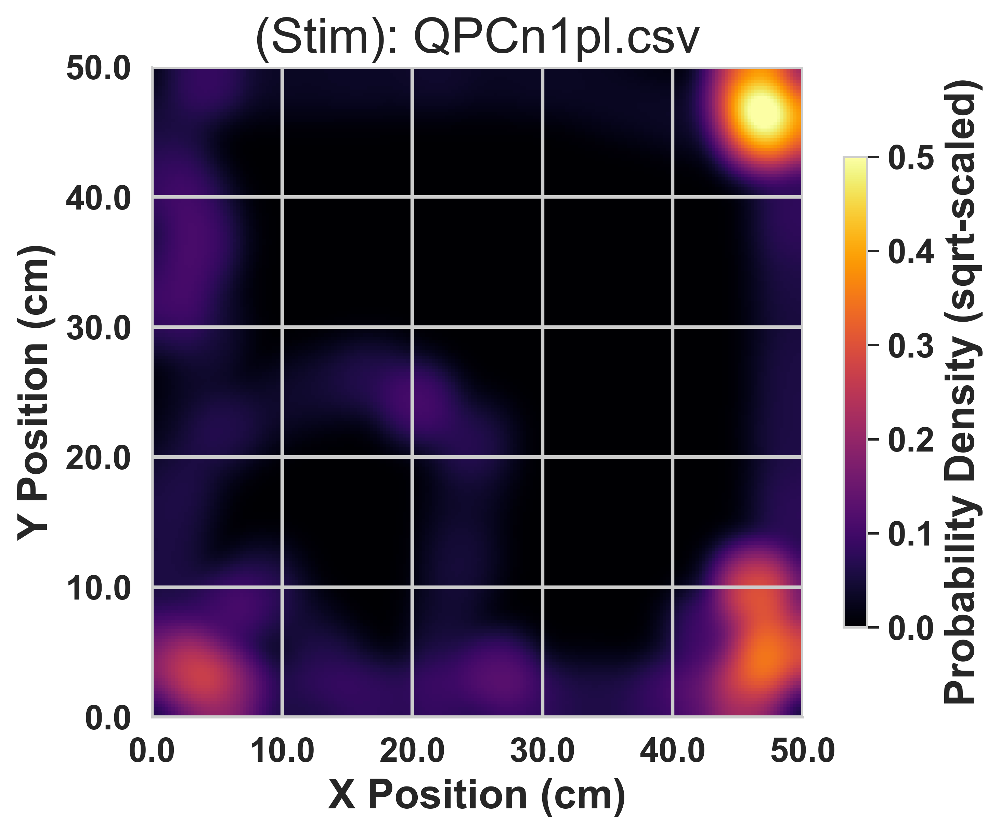

/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:332: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['distance'] = np.sqrt((df['corrected_x'].diff()**2) + (df['corrected_y'].diff()**2))
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:335: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['speed'] = df['distance'] / (bin_size / frame_rate)  # Time interval for every 'bin_size' frames
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555

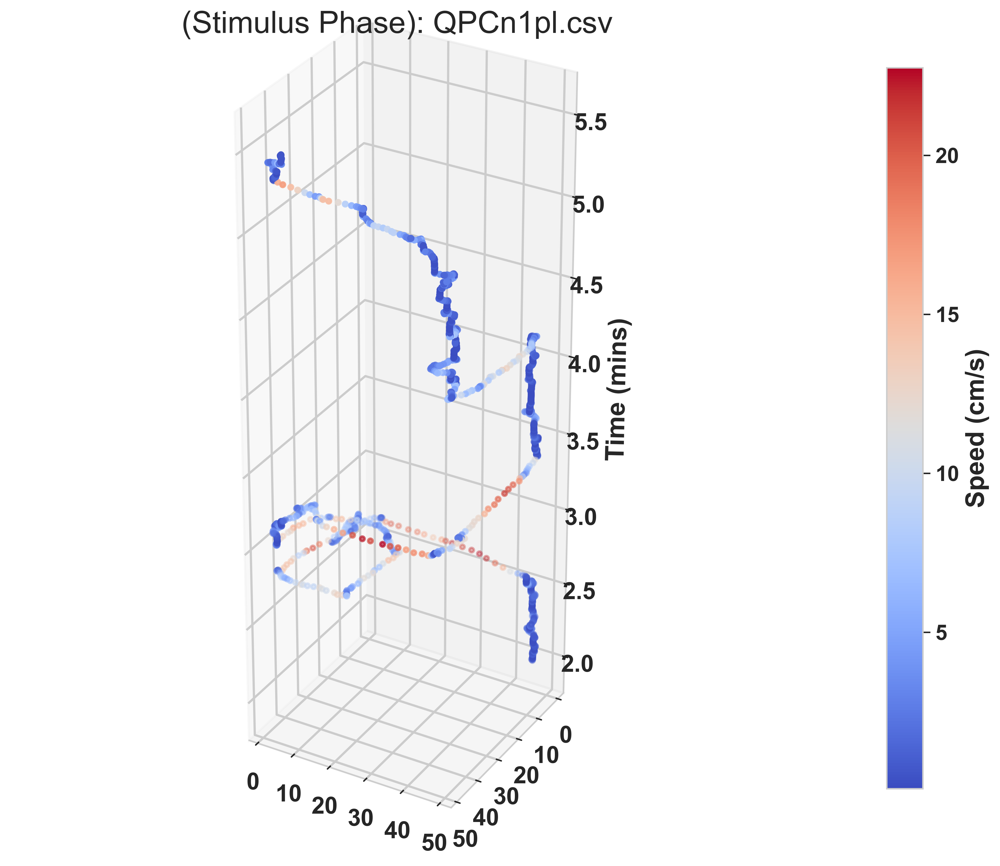

Processing /Users/apple/Desktop/Patriarchi_Lab/OF2/PPCn2pl.csv...


/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:154: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_y'].iloc[i] = df['corrected_y'].iloc[i - 1]
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:150: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_x'].iloc[i] = df['corrected_x'].iloc[i - 1]


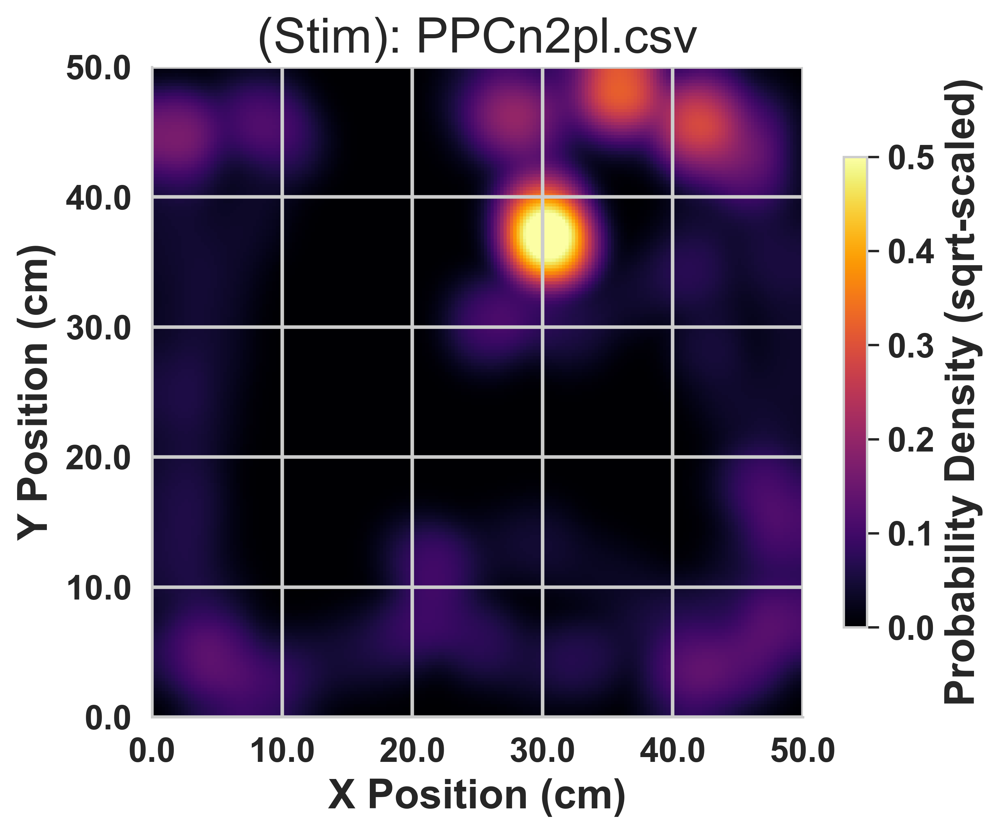

/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:332: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['distance'] = np.sqrt((df['corrected_x'].diff()**2) + (df['corrected_y'].diff()**2))
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:335: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['speed'] = df['distance'] / (bin_size / frame_rate)  # Time interval for every 'bin_size' frames
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555

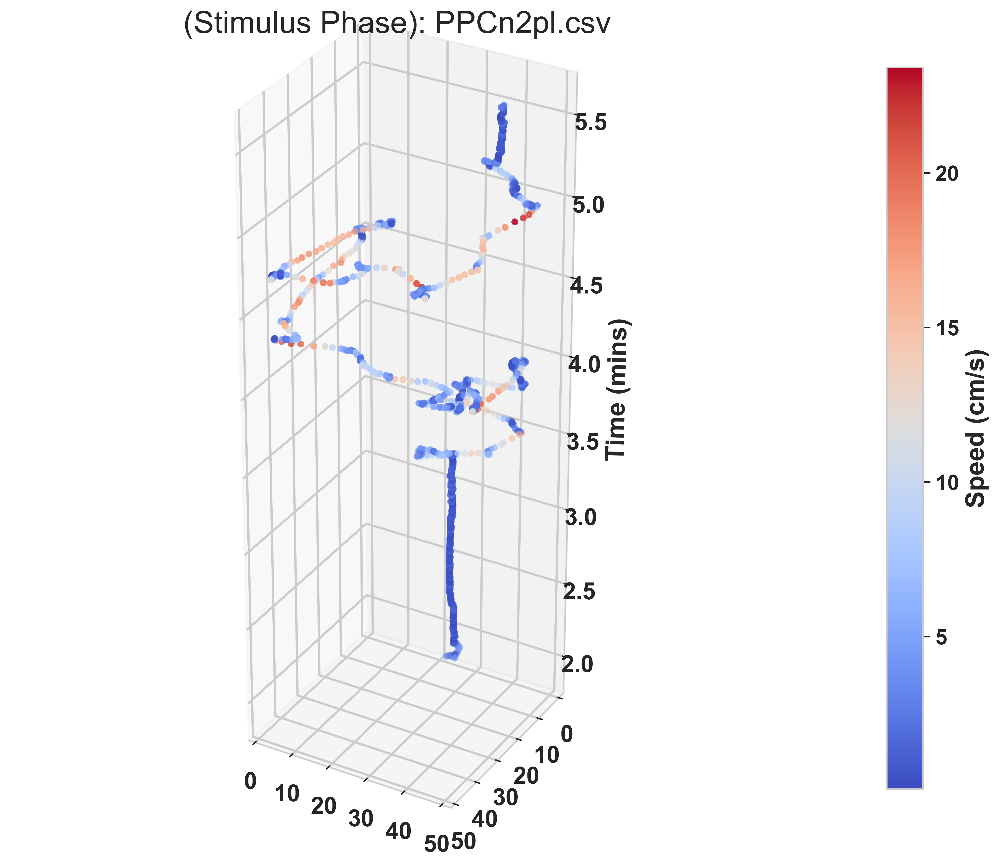

Processing /Users/apple/Desktop/Patriarchi_Lab/OF2/PPCn1pl.csv...


/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:150: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_x'].iloc[i] = df['corrected_x'].iloc[i - 1]
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:154: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_y'].iloc[i] = df['corrected_y'].iloc[i - 1]


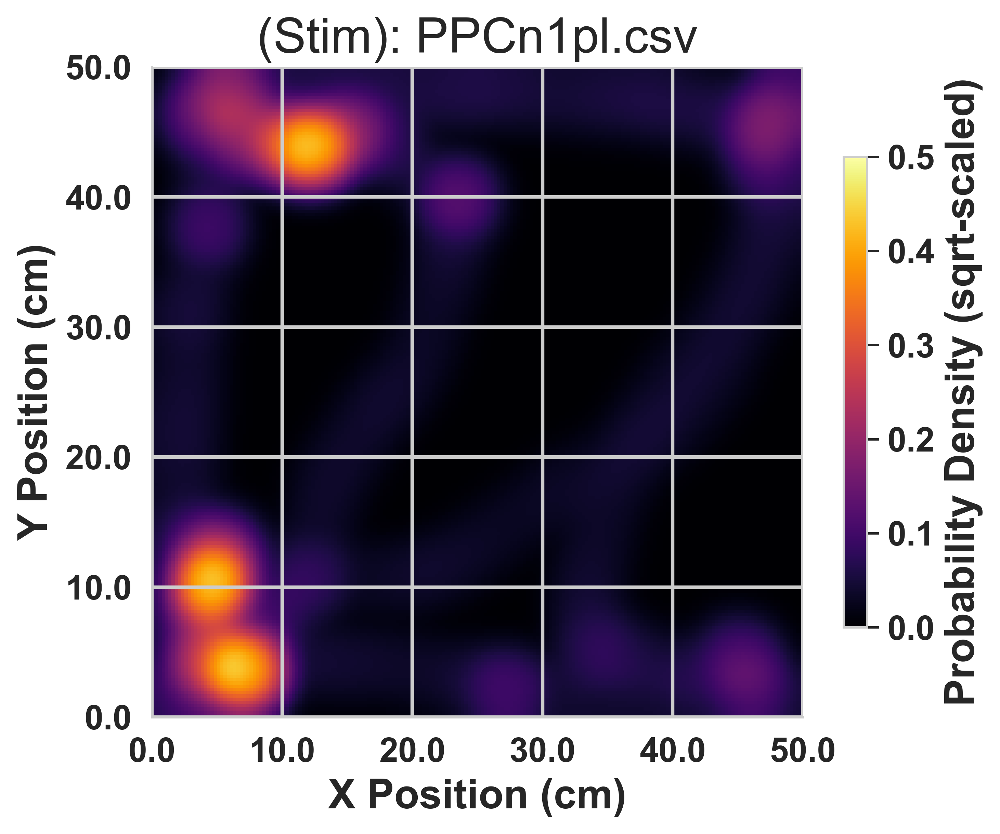

/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:332: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['distance'] = np.sqrt((df['corrected_x'].diff()**2) + (df['corrected_y'].diff()**2))
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:335: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['speed'] = df['distance'] / (bin_size / frame_rate)  # Time interval for every 'bin_size' frames
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555

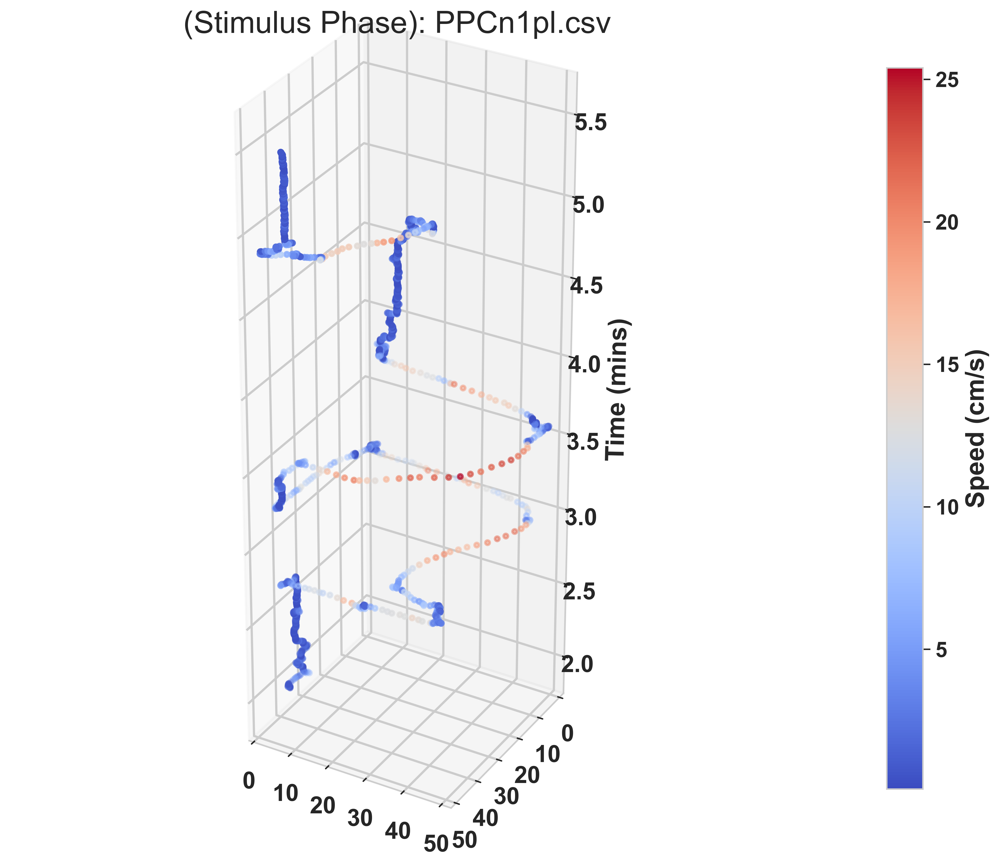

Processing /Users/apple/Desktop/Patriarchi_Lab/OF2/PPGt1pl.csv...


/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:150: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_x'].iloc[i] = df['corrected_x'].iloc[i - 1]
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:154: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_y'].iloc[i] = df['corrected_y'].iloc[i - 1]


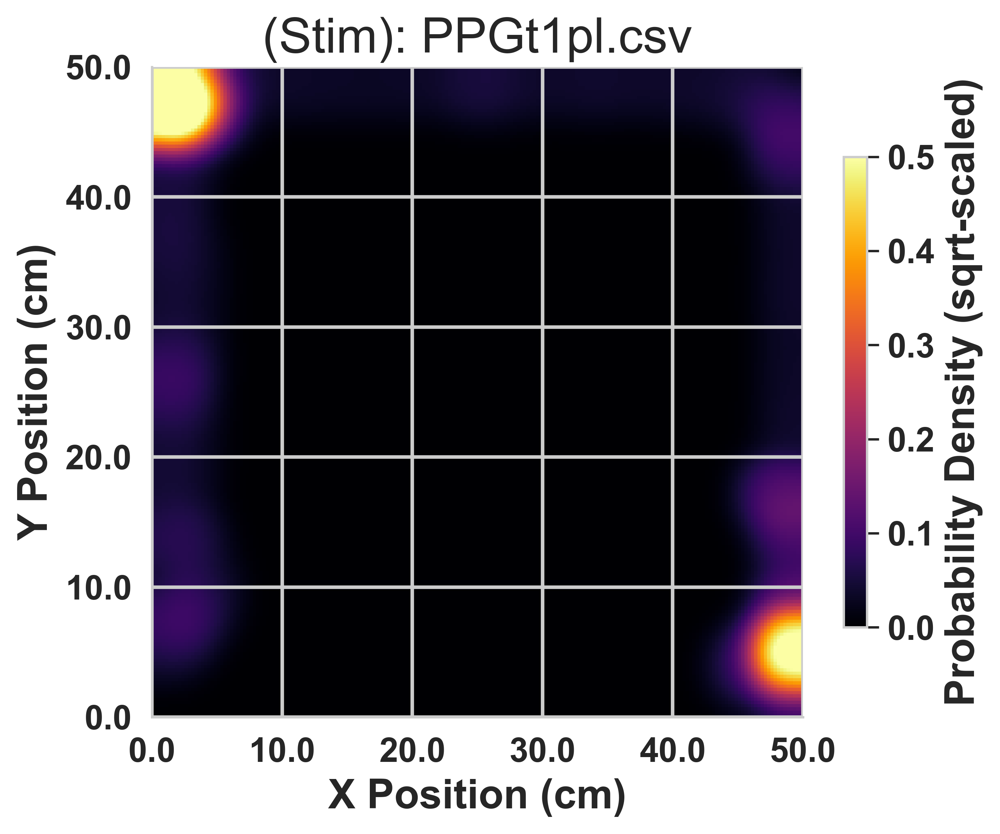

/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:332: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['distance'] = np.sqrt((df['corrected_x'].diff()**2) + (df['corrected_y'].diff()**2))
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:335: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['speed'] = df['distance'] / (bin_size / frame_rate)  # Time interval for every 'bin_size' frames
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555

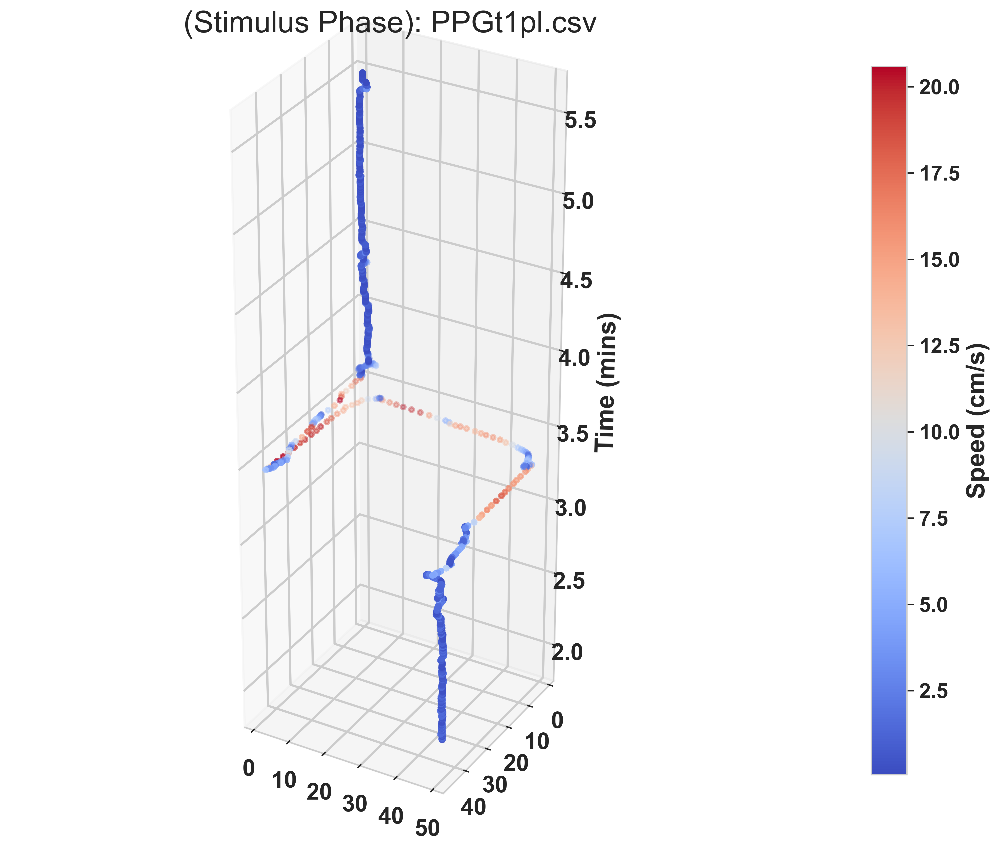

Processing /Users/apple/Desktop/Patriarchi_Lab/OF2/PPGt3pl.csv...


/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:154: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_y'].iloc[i] = df['corrected_y'].iloc[i - 1]
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:150: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_x'].iloc[i] = df['corrected_x'].iloc[i - 1]


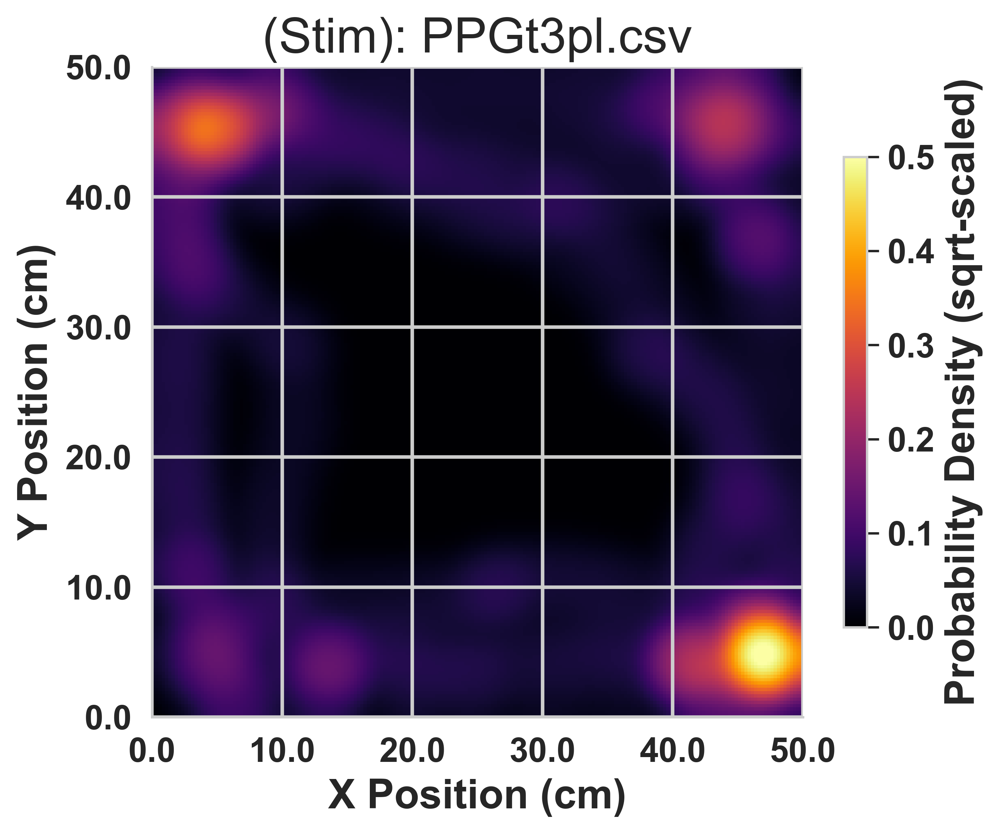

/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:332: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['distance'] = np.sqrt((df['corrected_x'].diff()**2) + (df['corrected_y'].diff()**2))
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:335: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['speed'] = df['distance'] / (bin_size / frame_rate)  # Time interval for every 'bin_size' frames
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555

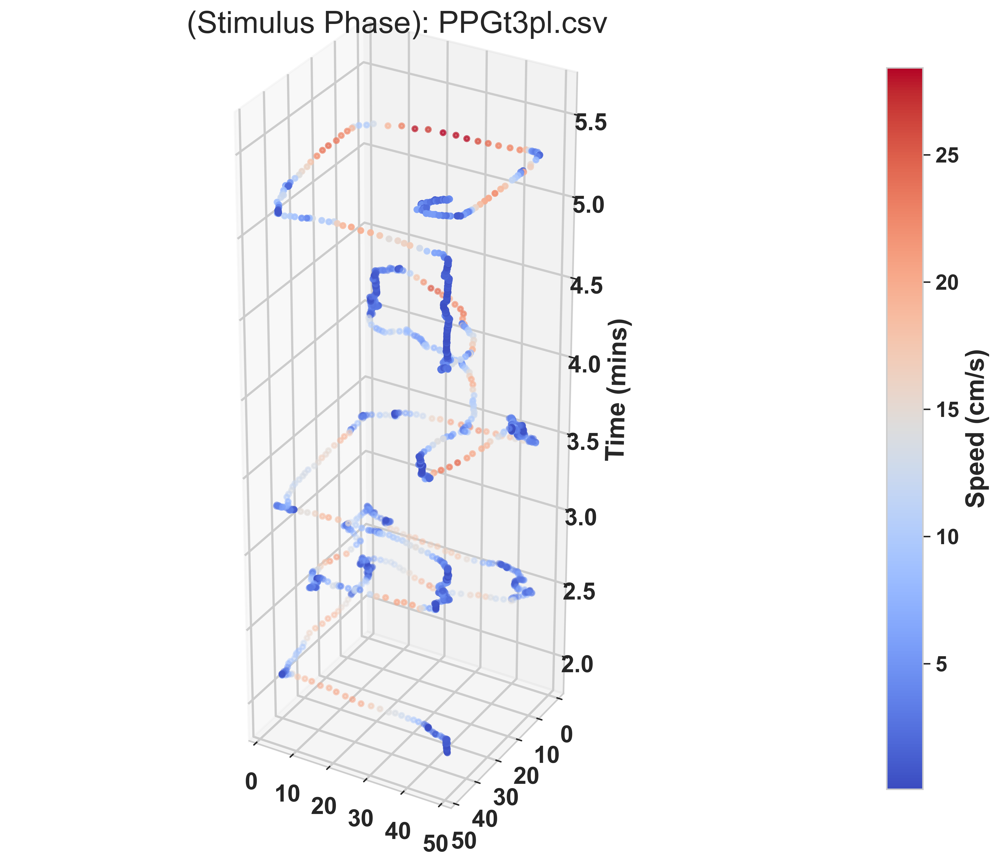

Processing /Users/apple/Desktop/Patriarchi_Lab/OF2/PPGt4pl.csv...


/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:150: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_x'].iloc[i] = df['corrected_x'].iloc[i - 1]
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:154: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_y'].iloc[i] = df['corrected_y'].iloc[i - 1]


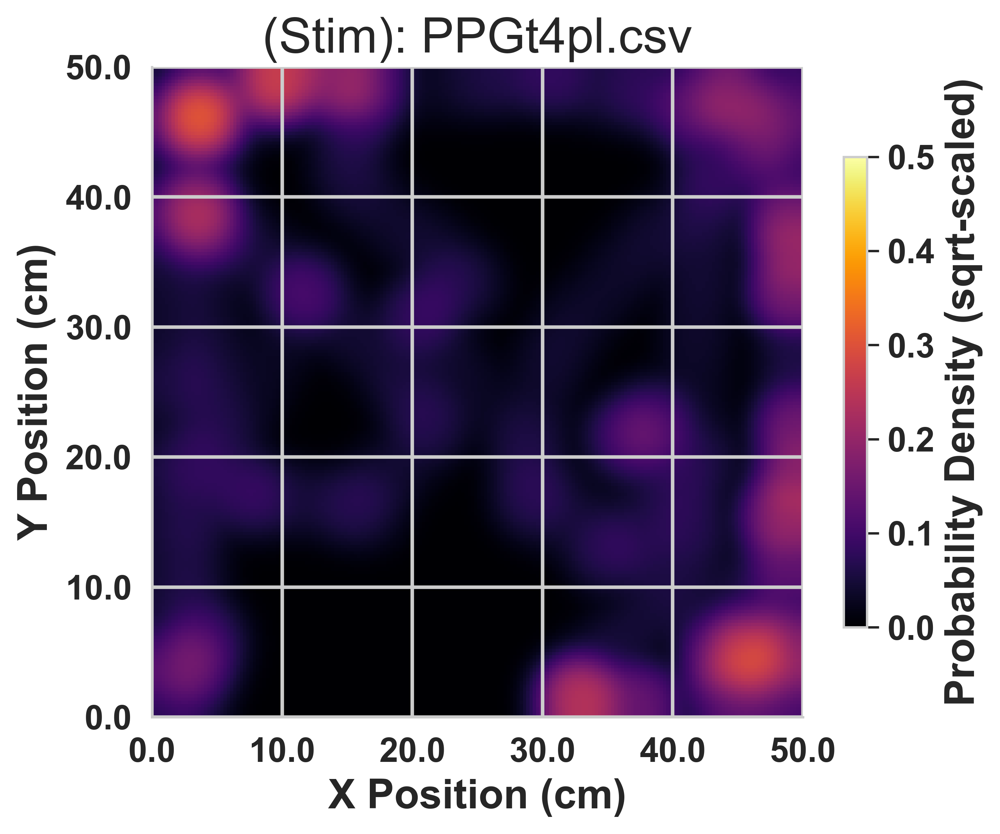

/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:332: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['distance'] = np.sqrt((df['corrected_x'].diff()**2) + (df['corrected_y'].diff()**2))
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:335: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['speed'] = df['distance'] / (bin_size / frame_rate)  # Time interval for every 'bin_size' frames
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555

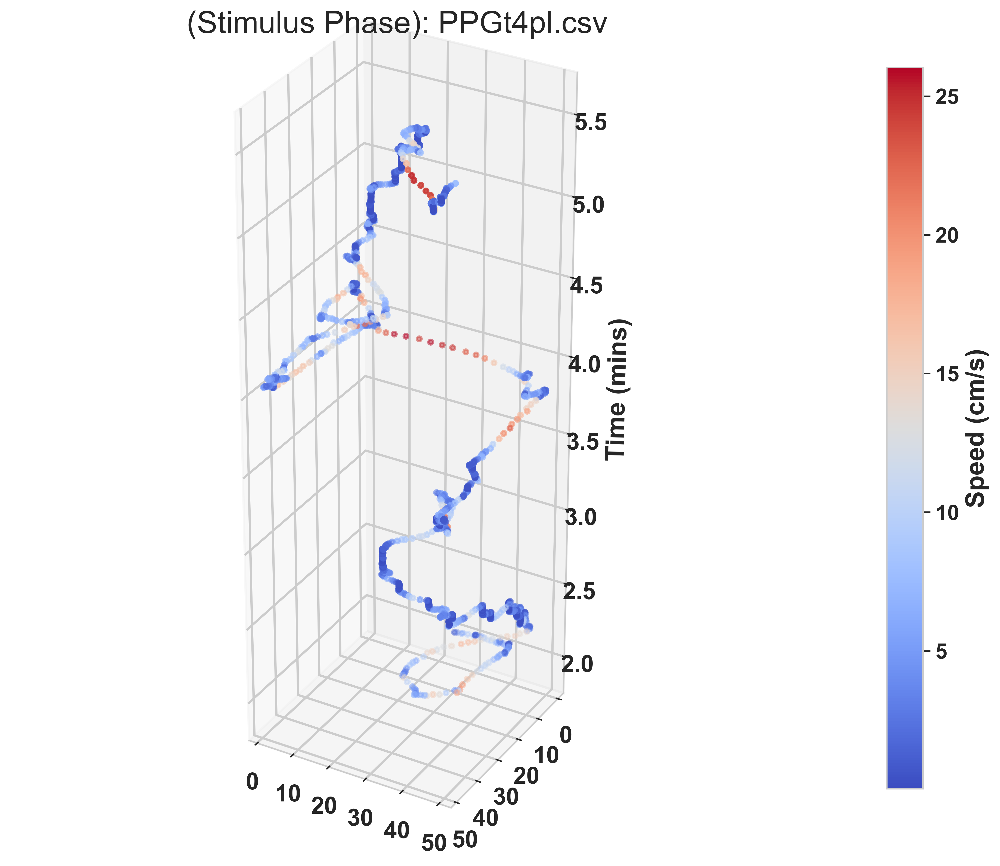

Processing /Users/apple/Desktop/Patriarchi_Lab/OF2/PPGt2pl.csv...


/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:150: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_x'].iloc[i] = df['corrected_x'].iloc[i - 1]
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:154: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['corrected_y'].iloc[i] = df['corrected_y'].iloc[i - 1]


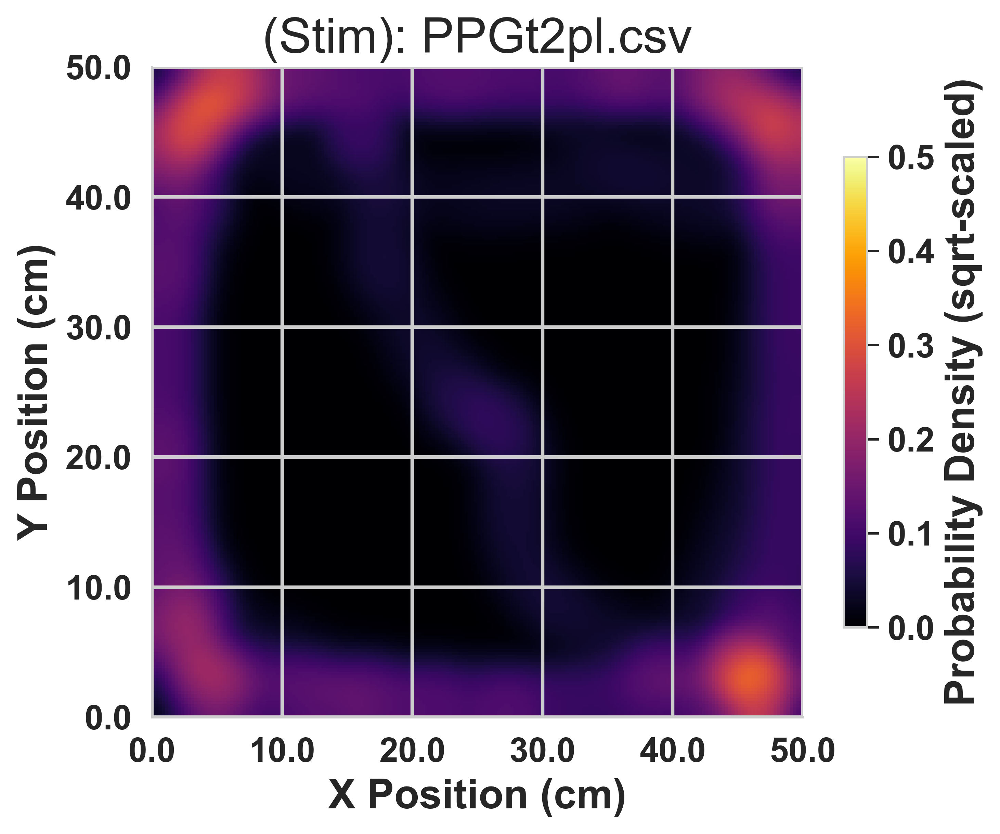

/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:332: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['distance'] = np.sqrt((df['corrected_x'].diff()**2) + (df['corrected_y'].diff()**2))
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/3322608194.py:335: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['speed'] = df['distance'] / (bin_size / frame_rate)  # Time interval for every 'bin_size' frames
/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555

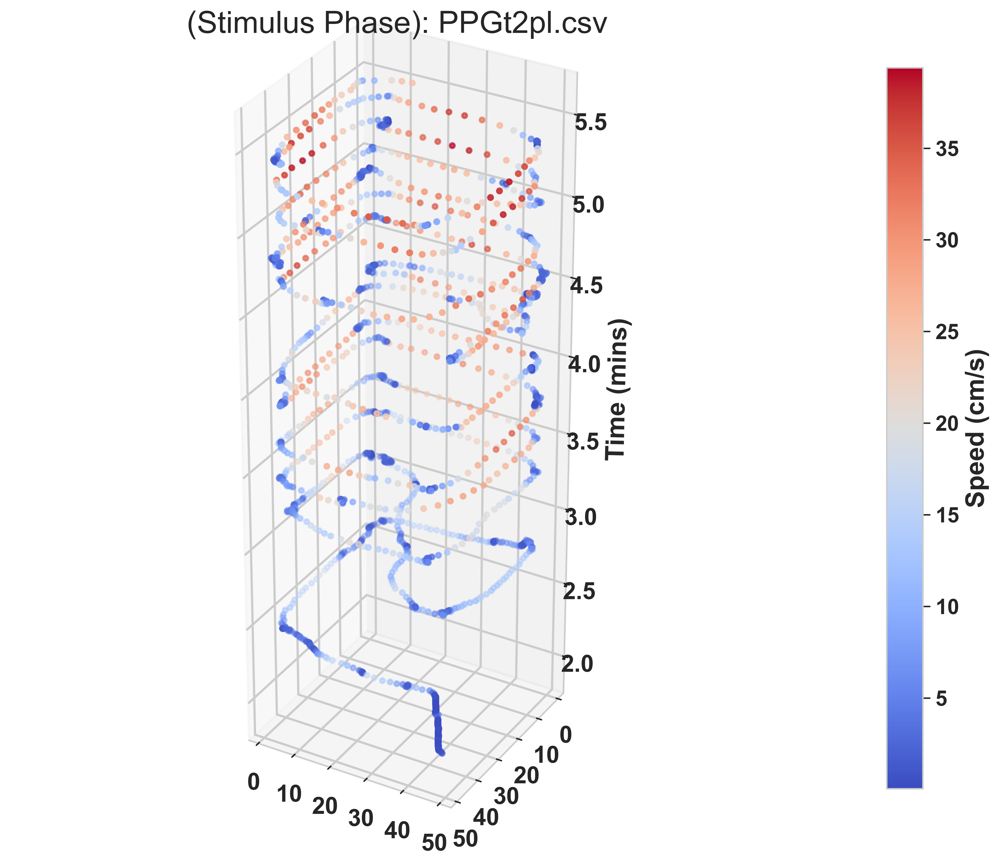

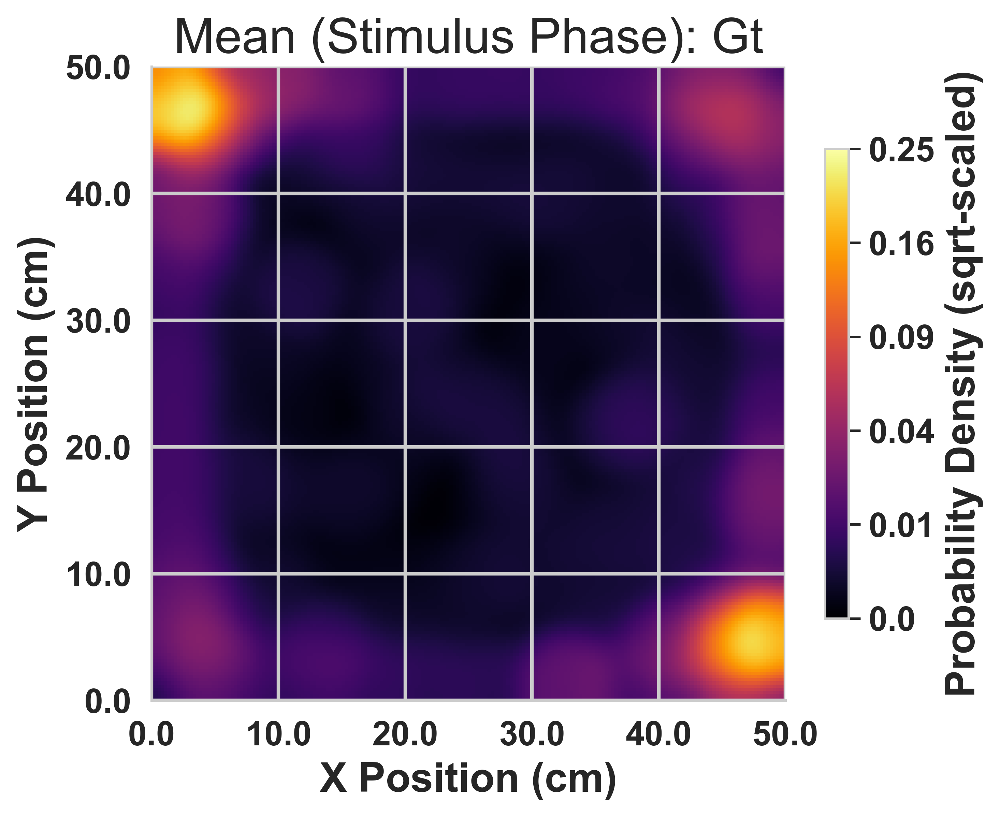

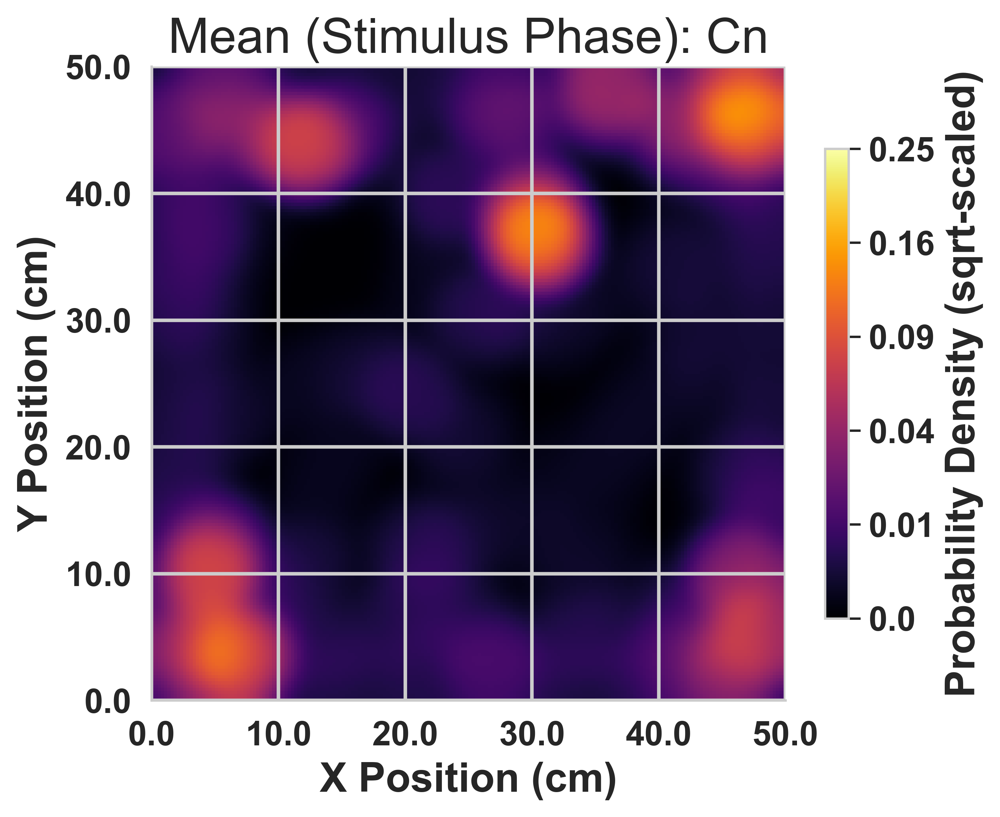

Results saved to 'phase_ratios_results.csv', 'total_delta_results.csv', and 'combined_corrected_data.csv'
     file_name  pre_phase_ratio  stimulus_phase_ratio  post_phase_ratio  \
0  QPCn1pl.csv         0.956000              0.976190          1.000000   
1  PPCn2pl.csv         0.764667              0.690286          0.990994   
2  PPCn1pl.csv         0.951000              0.985524          1.000000   
3  PPGt1pl.csv         1.000000              1.000000          1.000000   
4  PPGt3pl.csv         0.914333              0.996000          0.964298   
5  PPGt4pl.csv         0.986000              0.939238          1.000000   
6  PPGt2pl.csv         0.922000              0.981714          1.000000   

   pre_center  stim_center  post_center group  total_distance  \
0        5.28         5.00         0.00    Cn     1665.772095   
1       28.24        65.04         1.08    Cn     1577.684082   
2        5.88         3.04         0.00    Cn     1509.031372   
3        0.00         0.00       

In [ ]:
# V1.0

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2  # OpenCV library
from scipy.ndimage import gaussian_filter # For heatmap smoothing
from mpl_toolkits.mplot3d import Axes3D
# time check 
def default_img_set():
    import matplotlib as mpl 

    mpl.rcParams['interactive'] = True

    # figure
    mpl.rcParams['figure.frameon'] = False
    mpl.rcParams['figure.titleweight'] = 'regular'
    mpl.rcParams['figure.titlesize'] = 'xx-large'
    mpl.rcParams['figure.autolayout'] = True
    mpl.rcParams['figure.facecolor'] = 'w'
    mpl.rcParams['figure.edgecolor'] = 'None'
    mpl.rcParams['savefig.dpi'] = 300
    mpl.rcParams['savefig.format'] = 'pdf'
    mpl.rcParams['savefig.facecolor'] = 'None'
    mpl.rcParams['savefig.edgecolor'] = 'None'
    mpl.rcParams['savefig.bbox'] = 'tight'
    mpl.rcParams['pdf.fonttype'] = 42
    mpl.rcParams['ps.fonttype'] = 42
    mpl.rcParams['svg.fonttype'] = 'none'

    # axes
    mpl.rcParams['axes.facecolor'] = 'None'
    mpl.rcParams['axes.labelweight'] = 'bold'
    mpl.rcParams['axes.labelsize'] = 'x-large'
    mpl.rcParams['axes.titleweight'] = 'regular'
    mpl.rcParams['axes.titlesize'] = 'xx-large'
    mpl.rcParams['axes.linewidth'] = 1
    mpl.rcParams['axes.unicode_minus'] = False
    mpl.rcParams['xtick.major.width'] = 1
    mpl.rcParams['xtick.major.size'] = 5
    mpl.rcParams['xtick.labelsize'] = 'large'
    mpl.rcParams['ytick.major.width'] = 1
    mpl.rcParams['ytick.major.size'] = 5
    mpl.rcParams['ytick.labelsize'] = 'large'
    mpl.rcParams['lines.linewidth'] = 2
    mpl.rcParams['axes.spines.right'] = False
    mpl.rcParams['axes.spines.top'] = False
    # Character
    mpl.rcParams['font.family'] = 'sans-serif'
    mpl.rcParams['font.sans-serif'] = 'Arial'
    mpl.rcParams['font.weight'] = 'bold'
    # legend
    mpl.rcParams['legend.frameon'] = False

# Define global parameters
frame_rate = 25
bin_size = 3
phase = 'stim' # Phase can be 'stim' or 'total'. This defines phases plotted on heatmaps and 3d trajectory maps.

def load_data(file_path):
    # Extract the file name from the file path
    file_name = file_path.split('/')[-1]  # Adjust this based on path format
    
    df = pd.read_csv(file_path)
    df.columns = df.iloc[0] + df.iloc[1]  # Handle double-row headers
    df = df.drop(df.index[0:2])  # Drop first two rows
    df.columns.values[0] = 'frame'  # Rename the first column to 'frame'
    
    # Convert 'frame' column to numeric, replacing non-numeric values with NaN
    df['frame'] = pd.to_numeric(df['frame'], errors='coerce')
    
    # Convert all columns containing 'likelihood' in the name to numeric
    likelihood_cols = [col for col in df.columns if 'likelihood' in col]
    df[likelihood_cols] = df[likelihood_cols].apply(pd.to_numeric, errors='coerce')
    
    # Remove rows with NaN in the 'frame' column
    df = df.dropna(subset=['frame'])
    
    # Add a column for the file name
    df['file_name'] = file_name
    
    # Reset the index after dropping rows
    df = df.reset_index(drop=True)
    
    return df

# Function to calculate the median of each corner's coordinates
def calculate_medians(df):
    medians = {
        'topleftcornerx_median': df['topleftcornerx'].median(),
        'topleftcornery_median': df['topleftcornery'].median(),
        'toprightcornerx_median': df['toprightcornerx'].median(),
        'toprightcornery_median': df['toprightcornery'].median(),
        'bottomleftcornerx_median': df['bottomleftcornerx'].median(),
        'bottomleftcornery_median': df['bottomleftcornery'].median(),
        'bottomrightcornerx_median': df['bottomrightcornerx'].median(),
        'bottomrightcornery_median': df['bottomrightcornery'].median()
    }
    return pd.DataFrame([medians])


# Function to compute homography and apply it to the body part coordinates
def apply_homography(df, medians_df):
    source_points = np.array([
        [medians_df.iloc[:, 0], medians_df.iloc[:, 1]],
        [medians_df.iloc[:, 2], medians_df.iloc[:, 3]],
        [medians_df.iloc[:, 4], medians_df.iloc[:, 5]],
        [medians_df.iloc[:, 6], medians_df.iloc[:, 7]]
    ])

    # Mapping onto a 500*500 scale
    destination_points = np.array([
        [0, 0],         # Top-left (0, 0)
        [50, 0],       # Top-right (500, 0)
        [0, 50],       # Bottom-left (0, 500)
        [50, 50]      # Bottom-right (500, 500)
    ])

    homography_matrix, _ = cv2.findHomography(source_points, destination_points)

    def transform_coordinates(row):
        point = np.array([[row['bodycenterx'], row['bodycentery']]], dtype='float32')
        point = np.array([point])  # Reshape for homography
        transformed_point = cv2.perspectiveTransform(point, homography_matrix)
        return pd.Series([transformed_point[0][0][0], transformed_point[0][0][1]])

    df_corrected = df.copy()
    df_corrected[['corrected_x', 'corrected_y']] = df_corrected.apply(transform_coordinates, axis=1)
    return df_corrected

###
def outlier_removal(df):
    # Calculate the quantiles for corrected_x and corrected_y
    x_lower_bound, x_upper_bound = df['corrected_x'].quantile([0.005, 0.995])
    y_lower_bound, y_upper_bound = df['corrected_y'].quantile([0.005, 0.995])

    # Define a function to replace outliers or low likelihood with the previous non-outlier value
    def replace_with_previous_non_outlier(df, lower_x, upper_x, lower_y, upper_y):
        for i in range(1, len(df)):
            # Check for outliers in corrected_x or corrected_y
            is_x_outlier = df['corrected_x'].iloc[i] < lower_x or df['corrected_x'].iloc[i] > upper_x
            is_y_outlier = df['corrected_y'].iloc[i] < lower_y or df['corrected_y'].iloc[i] > upper_y
            
            # Check if bodycenterlikelihood is smaller than 0.6
            is_low_likelihood = df['bodycenterlikelihood'].iloc[i] < 0.6

            # Replace 'corrected_x' if it's an outlier or if likelihood is low
            if is_x_outlier or is_low_likelihood:
                df['corrected_x'].iloc[i] = df['corrected_x'].iloc[i - 1]

            # Replace 'corrected_y' if it's an outlier or if likelihood is low
            if is_y_outlier or is_low_likelihood:
                df['corrected_y'].iloc[i] = df['corrected_y'].iloc[i - 1]

        return df

    # Apply the function to replace outliers and low-likelihood values
    df_corrected = replace_with_previous_non_outlier(df.copy(), x_lower_bound, x_upper_bound, y_lower_bound, y_upper_bound)

    return df_corrected


# Function to calculate the wall/total ratio for a specific phase
def calculate_phase_wt_ratio(df, start_frame, end_frame):
    phase_data = df[(df['frame'] >= start_frame) & (df['frame'] < end_frame)]
    wall_count = len(phase_data[phase_data['wc'] == 0])
    center_count = len(phase_data[phase_data['wc'] == 1])
    center_time = center_count/frame_rate
    total_count = len(phase_data)
    if total_count == 0:
        return float('nan')
    return wall_count / total_count, center_time

# time check


import matplotlib.patches as patches

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

def plot_occupation_heatmap(df_corrected, mouse_name, phase='stim', pre_phase_end=3000, stimulus_phase_end=8250, bins=200, arena_size=50, std_dev=4.0, dpi=500, mouse_diameter=5, vmax_ratio=0.5):
    """
    Plots an occupation probability density heatmap of the mouse's movement in the arena, with Gaussian smoothing,
    and represents the mouse as a circle of 5 cm diameter in a 50cm x 50cm arena.
    
    :param df_corrected: DataFrame containing corrected X and Y coordinates.
    :param mouse_name: Name of the mouse for labeling.
    :param phase: Specify 'total' to plot the entire session or 'stim' for stimulus phase only.
    :param pre_phase_end: The frame number where the pre-phase ends.
    :param stimulus_phase_end: The frame number where the stimulus phase ends.
    :param bins: Number of bins to divide the arena (default: 200x200 grid).
    :param arena_size: Size of the arena in cm (default: 50x50 cm).
    :param std_dev: Standard deviation for Gaussian smoothing (default: 4.0).
    :param dpi: Dots per inch for the plot resolution (default: 500).
    :param mouse_diameter: Diameter of the mouse in cm (default: 5 cm).
    :param vmax_ratio: Ratio for the upper limit of the color scale, default is 10% of the total time.
    """
    # Filter data based on the phase
    if phase == 'stim':
        df_phase = df_corrected[(df_corrected['frame'] >= pre_phase_end) & (df_corrected['frame'] < stimulus_phase_end)]
        title_suffix = "(Stim)"
    else:
        df_phase = df_corrected
        title_suffix = "(Total)"
    
    # Calculate total number of frames
    total_frames = len(df_phase)
    
    # Initialize an empty heatmap
    heatmap = np.zeros((bins, bins))
    
    # Define the bin edges
    xedges = np.linspace(0, arena_size, bins + 1)
    yedges = np.linspace(0, arena_size, bins + 1)

    # Iterate over each row in df_phase and add a 5 cm circle to the heatmap
    for index, row in df_phase.iterrows():
        x = row['corrected_x']
        y = row['corrected_y']
        
        # Calculate which bin the circle falls into
        x_bin = np.digitize(x, xedges) - 1
        y_bin = np.digitize(y, yedges) - 1
        
        # Add the 5 cm diameter (converted to bins) to the heatmap
        radius_bins = int((mouse_diameter / arena_size) * bins / 2)
        for i in range(max(0, x_bin - radius_bins), min(bins, x_bin + radius_bins + 1)):
            for j in range(max(0, y_bin - radius_bins), min(bins, y_bin + radius_bins + 1)):
                distance = np.sqrt((i - x_bin)**2 + (j - y_bin)**2)
                if distance <= radius_bins:
                    heatmap[i, j] += 1

    # Normalize the heatmap to convert it to a probability density (i.e., divide by the total frames)
    heatmap_density = heatmap / total_frames

    # Apply Gaussian smoothing to the probability density heatmap
    heatmap_smooth = gaussian_filter(heatmap_density, sigma=std_dev)
    
    # Apply square root scaling to reduce contrast
    heatmap_scaled = np.sqrt(heatmap_smooth)
    
    # Plot the smoothed and square-root-scaled heatmap
    plt.figure(figsize=(6, 6), dpi=dpi)
    img = plt.imshow(heatmap_scaled.T, origin='upper', cmap='inferno', extent=[0, arena_size, 0, arena_size], 
                     aspect='equal', vmin=0, vmax=vmax_ratio)  # Use provided vmax_ratio

    # Set the x and y ticks for 50 x 50 cm grid
    tick_positions = np.linspace(0, arena_size, num=6)  # 6 ticks from 0 to 50 cm
    tick_labels = np.linspace(0, 50, num=6)  # Scale to 0 to 50 cm

    plt.xticks(tick_positions, tick_labels)  # Set x-axis tick positions and labels
    plt.yticks(tick_positions, tick_labels)  # Set y-axis tick positions and labels
    
    # Add labels and title
    plt.title(f"{title_suffix}: {mouse_name}")
    plt.xlabel('X Position (cm)')
    plt.ylabel('Y Position (cm)')
    
    # Create a colorbar that reflects the occupation density
    cbar = plt.colorbar(img, shrink=0.5)  # Adjust shrink value between 0 and 1 to control length
    cbar.set_label('Probability Density (sqrt-scaled)')

    plt.tight_layout()
    plt.show()
    
# Modified function to process a single CSV file
def process_file(file_path):
    print(f"Processing {file_path}...")
    df = load_data(file_path)
    medians_df = calculate_medians(df)
    df_corrected = apply_homography(df, medians_df)
    df_corrected = outlier_removal(df_corrected)
    
    # Calculate wc (wall/center) for each frame
    df_corrected['wc'] = df_corrected.apply(lambda row: 1 if 12.5 < row['corrected_x'] < 37.5 and 12.5 < row['corrected_y'] < 37.5 else 0, axis=1)
    
    # Define frame ranges for each phase
    pre_phase_end = 3000
    stimulus_phase_end = pre_phase_end + 5250

    # Calculate wall/total ratios for each phase
    pre_ratio, pre_center = calculate_phase_wt_ratio(df_corrected, 0, pre_phase_end)
    stimulus_ratio, stim_center = calculate_phase_wt_ratio(df_corrected, pre_phase_end, stimulus_phase_end)
    post_ratio, post_center = calculate_phase_wt_ratio(df_corrected, stimulus_phase_end, df_corrected['frame'].max())

    # Create a dictionary with the results
    result = {
        'file_name': os.path.basename(file_path),
        'pre_phase_ratio': pre_ratio,
        'stimulus_phase_ratio': stimulus_ratio,
        'post_phase_ratio': post_ratio,
        'pre_center': pre_center,
        'stim_center': stim_center,
        'post_center': post_center
    }

    # Call the function to plot the heatmap
    mouse_name = os.path.basename(file_path)
    plot_occupation_heatmap(df_corrected, mouse_name, phase=phase)

    # # Call the function to plot the 3D speed over time and coordinates
    # plot_speed_3d(df_corrected, mouse_name, frame_rate=25, pre_phase_end=3000, stimulus_phase_end=8250, phase='stim')

    return df_corrected, result


# Function to calculate the total distance traveled and average speed with smoothing
def calculate_delta(df, start_frame=None, end_frame=None, bin_size=3, frame_rate=25, smoothing_window=3):
    """
    Calculate the total distance traveled and smoothed average speed, considering every `bin_size` frames.

    :param df: DataFrame containing the 'frame', 'corrected_x', and 'corrected_y' columns.
    :param start_frame: Start frame for the phase (optional).
    :param end_frame: End frame for the phase (optional).
    :param bin_size: Frame bin size to downsample the data (default: 3).
    :param frame_rate: Frame rate of the video (default: 25 frames per second).
    :param smoothing_window: Window size for smoothing the speed (default: 3).
    
    :return: Total distance and smoothed average speed.
    """
    # If start_frame and end_frame are provided, calculate for the specified phase
    if start_frame is not None and end_frame is not None:
        df = df[(df['frame'] >= start_frame) & (df['frame'] < end_frame)]
    
    # Select every 'bin_size' row (downsampling)
    df = df.iloc[::bin_size]
    
    # Calculate the Euclidean distance between consecutive selected frames
    df['distance'] = np.sqrt((df['corrected_x'].diff()**2) + (df['corrected_y'].diff()**2))
    
    # Calculate the speed: distance / (bin_size/frame_rate) seconds
    df['speed'] = df['distance'] / (bin_size / frame_rate)  # Time interval for every 'bin_size' frames
    
    # Apply smoothing to the speed values using a rolling window
    df['smoothed_speed'] = df['speed'].rolling(window=smoothing_window, min_periods=1).mean()
    
    # Sum the distances, ignoring NaN values
    total_distance = df['distance'].sum(skipna=True)
    
    # Calculate the average smoothed speed, ignoring NaN values
    average_smoothed_speed = df['smoothed_speed'].mean(skipna=True)
    
    return total_distance, average_smoothed_speed, df



def plot_speed_3d(df_corrected, mouse_name, frame_rate=25, pre_phase_end=3000, stimulus_phase_end=8250, phase='stim', height_scale=3):
    """
    Plots a 3D trajectory of the mouse's speed over time and space, adjusted for top-left corner origin.
    Parameters:
    df_corrected: DataFrame containing corrected X and Y coordinates.
    mouse_name: Name of the mouse for labeling.
    frame_rate: Frame rate of the video (default: 25 frames per second).
    pre_phase_end: End frame for the pre-phase (default: 3000).
    stimulus_phase_end: End frame for the stimulus phase (default: 8250).
    phase: Specify 'total' to plot the entire session or 'stim' for stimulus phase only (default: 'stim').
    height_scale: Scale factor for the height of the 3D plot (default: 3).
    """
    # Filter data based on the phase
    if phase == 'stim':
        df_phase = df_corrected[(df_corrected['frame'] >= pre_phase_end) & (df_corrected['frame'] < stimulus_phase_end)]
        title_suffix = "(Stimulus Phase)"
    else:
        df_phase = df_corrected
        title_suffix = "(Total Phase)"
    
    # Calculate time in minutes
    df_phase['time_min'] = df_phase['frame'] / (frame_rate * 60)

    # Create 3D plot
    fig = plt.figure(figsize=(10, 10), dpi=500)
    ax = fig.add_subplot(111, projection='3d')
    ax.set_box_aspect(aspect=(1, 1, height_scale))

    # Plot 3D trajectory
    sc = ax.scatter(df_phase['corrected_x'], df_phase['corrected_y'], df_phase['time_min'], 
                    c=df_phase['smoothed_speed'], cmap='coolwarm', s=10, marker='o')
    
    # Add color bar for speed
    cbar = plt.colorbar(sc, ax=ax, pad=0.1, shrink=0.7)
    cbar.set_label('Speed (cm/s)')

    # Set axis labels
    ax.set_zlabel('Time (mins)',labelpad=20)

    # Set tick label sizes
    ax.tick_params(axis='x', labelsize=16)  # X-axis tick labels
    ax.tick_params(axis='y', labelsize=16)  # Y-axis tick labels
    ax.tick_params(axis='z', labelsize=16)  # Z-axis tick labels

    # Flip the Y-axis
    ax.invert_yaxis()

    # Set plot title
    ax.set_title(f"{title_suffix}: {mouse_name}")

    # Set grid
    ax.grid(True)

    plt.tight_layout()
    plt.show()
# Function to extract group from filename
def get_group(filename):
    if 'Gt' in filename:
        return 'Gt'
    elif 'Cn' in filename:
        return 'Cn'
    return 'Unknown'

# Function to calculate mean heatmap for a group, accounting for mouse size
def calculate_mean_heatmap(df_list, arena_size=50, bins=100, mouse_diameter=7):
    """
    Calculate mean heatmap from multiple DataFrames, accounting for mouse size.
    
    :param df_list: List of DataFrames containing corrected coordinates.
    :param arena_size: Size of the arena in cm (default: 50 cm).
    :param bins: Number of bins for the histogram (default: 100x100 grid).
    :param mouse_diameter: Diameter of the mouse in cm (default: 7 cm).
    :return: Mean heatmap array.
    """
    all_heatmaps = []
    
    # Define the bin edges
    xedges = np.linspace(0, arena_size, bins + 1)
    yedges = np.linspace(0, arena_size, bins + 1)
    
    # Convert mouse diameter to bin units
    radius_bins = int((mouse_diameter / arena_size) * bins / 2)
    
    for df in df_list:
        # Initialize empty heatmap
        heatmap = np.zeros((bins, bins))
        
        # Iterate over each row in DataFrame and add a 7cm circle to the heatmap
        for index, row in df.iterrows():
            x = row['corrected_x']
            y = row['corrected_y']
            
            # Calculate which bin the circle falls into
            x_bin = np.digitize(x, xedges) - 1
            y_bin = np.digitize(y, yedges) - 1
            
            # Add the 7cm diameter (converted to bins) to the heatmap
            for i in range(max(0, x_bin - radius_bins), min(bins, x_bin + radius_bins + 1)):
                for j in range(max(0, y_bin - radius_bins), min(bins, y_bin + radius_bins + 1)):
                    distance = np.sqrt((i - x_bin)**2 + (j - y_bin)**2)
                    if distance <= radius_bins:
                        heatmap[i, j] += 1
        
        # Normalize the heatmap
        heatmap_density = heatmap / len(df)
        all_heatmaps.append(heatmap_density)
    
    # Calculate mean heatmap
    mean_heatmap = np.mean(all_heatmaps, axis=0)
    return mean_heatmap

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# Function to plot mean heatmap with mouse size and percent of total time
def plot_mean_occupation_heatmap(group_dfs, group_name, phase='stim', pre_phase_end=3000, 
                                 stimulus_phase_end=8250, bins=200, arena_size=50, 
                                 std_dev=4.0, dpi=500, mouse_diameter=7, vmax_ratio=0.5):
    """
    Plot mean occupation heatmap for a group with Gaussian smoothing and 
    mouse size represented as a circle. Color scale is in percentage of total time.
    """
    # Filter data based on phase for all DataFrames
    if phase == 'stim':
        group_dfs_phase = [df[(df['frame'] >= pre_phase_end) & 
                              (df['frame'] < stimulus_phase_end)] 
                           for df in group_dfs]
        title_suffix = "(Stimulus Phase)"
    else:
        group_dfs_phase = group_dfs
        title_suffix = "(Total Phase)"
    
    # Calculate mean heatmap
    mean_heatmap = calculate_mean_heatmap(group_dfs_phase, arena_size, bins, mouse_diameter)
    
    # Apply Gaussian smoothing
    heatmap_smooth = gaussian_filter(mean_heatmap, sigma=std_dev)
    
    # Apply square root scaling to smooth contrast
    heatmap_scaled = np.sqrt(heatmap_smooth)
    
    # Create plot
    plt.figure(figsize=(6, 6), dpi=dpi)
    img = plt.imshow(heatmap_scaled.T, origin='upper', cmap='inferno',
                     extent=[0, arena_size, 0, arena_size], aspect='equal', vmin=0, vmax=vmax_ratio)
    
    # Set ticks for 50 x 50 cm grid
    tick_positions = np.linspace(0, arena_size, num=6)
    tick_labels = np.linspace(0, 50, num=6)
    plt.xticks(tick_positions, tick_labels)
    plt.yticks(tick_positions, tick_labels)
    
    # Add labels and title
    plt.title(f"Mean {title_suffix}: {group_name}")
    plt.xlabel('X Position (cm)')
    plt.ylabel('Y Position (cm)')
    
    # Add colorbar to reflect percentage of total time
    cbar = plt.colorbar(img, shrink=0.5)  # Adjust shrink value between 0 and 1 to control length
    cbar.set_label('Probability Density (sqrt-scaled)')
    
    # Adjust colorbar ticks for original (untransformed) values
    tick_values = cbar.get_ticks()
    cbar.set_ticks(tick_values)
    cbar.set_ticklabels((tick_values ** 2).round(2))  # Square values back to original scale
    
    plt.tight_layout()
    plt.show()
# Modified function to process all CSV files in a directory
def process_directory(directory_path, frame_rate=25):
    # default_img_set()

    # Initialize group dictionaries
    group_data = {
        'Gt': [],
        'Cn': []
    }
    
    results = []
    delta = []
    all_df_corrected = []
    for file_name in os.listdir(directory_path):
        if file_name.endswith('.csv'):
            file_path = os.path.join(directory_path, file_name)
            df_corrected, result = process_file(file_path)
            
            # Add group information
            group = get_group(file_name)
            df_corrected['group'] = group
            result['group'] = group
            
            # Store DataFrame in appropriate group list
            group_data[group].append(df_corrected)
            
            # Calculate total distance for all frames
            total_distance, total_speed, df_corrected = calculate_delta(df_corrected)

            # Calculate total distance for pre phase (0 to 3000 frames)
            distance_pre_phase, pre_speed, _ = calculate_delta(df_corrected, 0, 3000)
            
            # Calculate total distance for stimulus phase (3000 to 8250 frames)
            distance_stimulus_phase, stim_speed, _ = calculate_delta(df_corrected, 3000, 8250)

            # Calculate total distance for pre phase (0 to 3000 frames)
            distance_post_phase, post_speed, _ = calculate_delta(df_corrected, 8250, 12000)      

            # Append results
            result['total_distance'] = total_distance
            result['distance_pre_phase'] = distance_pre_phase
            result['distance_stimulus_phase'] = distance_stimulus_phase
            result['distance_post_phase'] = distance_post_phase
            results.append(result)
            
            # Append to distances DataFrame
            delta.append({
                'file_name': result['file_name'], 
                'total_distance': total_distance, 
                'distance_pre_phase': distance_pre_phase,
                'distance_stimulus_phase': distance_stimulus_phase,
                'distance_post_phase': distance_post_phase,
                'speed_total': total_speed,
                'speed_pre': pre_speed,
                'speed_stim': stim_speed,
                'speed_post': post_speed
            })
            
            # Add file_name column to df_corrected and append to all_df_corrected
            df_corrected['file_name'] = result['file_name']
            
            # Add sec column to df_corrected (frame // frame_rate)
            df_corrected['sec'] = (df_corrected['frame'] // frame_rate).astype(int)
            # Call the function to plot the 3D speed over time and coordinates
            mouse_name = os.path.basename(file_path)
            plot_speed_3d(df_corrected, mouse_name, frame_rate=25, pre_phase_end=3000, stimulus_phase_end=8250, phase=phase)
            all_df_corrected.append(df_corrected)
    
    # Create DataFrames from the results
    wall_ratio_df = pd.DataFrame(results)
    delta_df = pd.DataFrame(delta)
    
    # Concatenate all df_corrected DataFrames
    combined_df_corrected = pd.concat(all_df_corrected, ignore_index=True)
    
    # Plot mean heatmaps for each group
    for group_name, group_dfs in group_data.items():
        if group_dfs:  # Check if group has any data
            plot_mean_occupation_heatmap(group_dfs, group_name, phase=phase)

    # Save the results to CSV files
    wall_ratio_df.to_csv('phase_ratios_results.csv', index=False)
    delta_df.to_csv('total_delta_results.csv', index=False)
    combined_df_corrected.to_csv('combined_corrected_data.csv', index=False)
    
    print("Results saved to 'phase_ratios_results.csv', 'total_delta_results.csv', and 'combined_corrected_data.csv'")
    return wall_ratio_df, delta_df, combined_df_corrected

# Main function to start processing
if __name__ == "__main__":
    directory = '/Users/apple/Desktop/Patriarchi_Lab/OF2'  # Replace with the correct path
    wall_ratio_df, delta_df, combined_df_corrected = process_directory(directory)
    print(wall_ratio_df)  # Display the wall ratio results DataFrame
    print(delta_df)  # Display the total delta DataFrame
    print(combined_df_corrected.head())    # Display the combined corrected DataFrame

/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/650171090.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='group', y='total_distance', data=delta_df, palette=custom_palette, width=0.4)  # Adjust width here


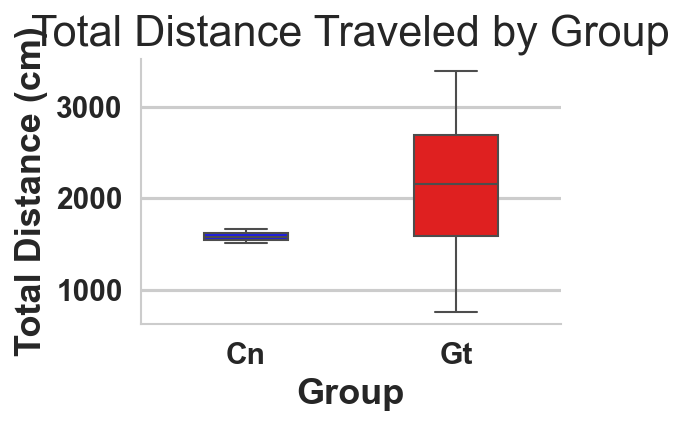

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns


# Add 'group' column based on 'file_name'
delta_df['group'] = delta_df['file_name'].apply(lambda x: 'Gt' if 'Gt' in x else ('Cn' if 'Cn' in x else 'Other'))

# Plot box plots for the two groups (Gt and Cn) with specified colors and narrower boxes
def plot_distance_by_group(delta_df):
    default_img_set()
    plt.figure(figsize=(4, 3), dpi=150)
    
    # Define custom color palette
    custom_palette = {'Gt': 'red', 'Cn': 'blue'}
    
    # Create boxplot using seaborn with custom colors and narrower boxes
    sns.boxplot(x='group', y='total_distance', data=delta_df, palette=custom_palette, width=0.4)  # Adjust width here
    
    # Add labels and title
    plt.xlabel('Group')
    plt.ylabel('Total Distance (cm)')
    plt.title('Total Distance Traveled by Group')
    
    # Show plot
    plt.tight_layout()
    plt.show()

# Call the function to plot the data
plot_distance_by_group(delta_df)

/var/folders/wp/rkw0mtqs4856nczw_4ydgjcc0000gn/T/ipykernel_42555/512669053.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='group', y='speed_total', data=delta_df, palette=custom_palette, width=0.4)  # Adjust width here


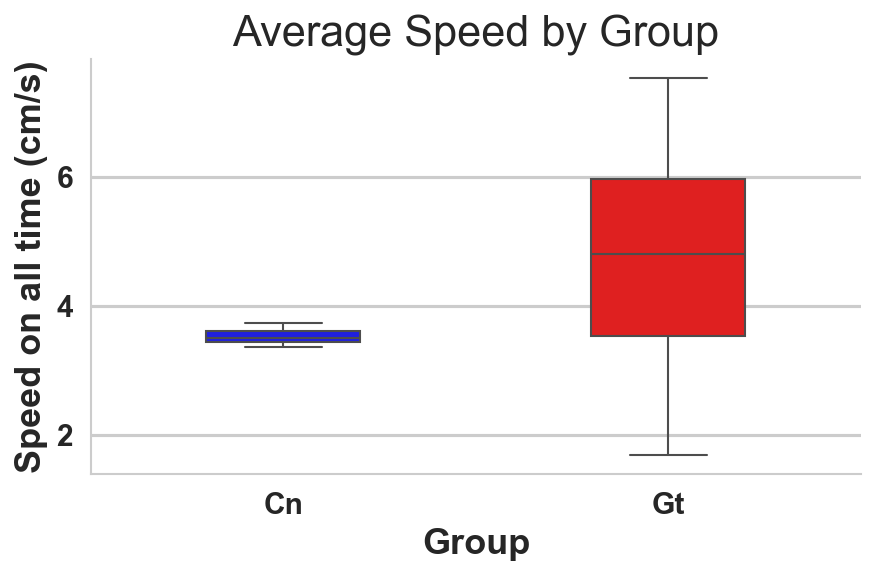

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns


# Add 'group' column based on 'file_name'
delta_df['group'] = delta_df['file_name'].apply(lambda x: 'Gt' if 'Gt' in x else ('Cn' if 'Cn' in x else 'Other'))

# Plot box plots for the two groups (Gt and Cn) with specified colors and narrower boxes
def plot_speed_by_group(delta_df):
    # default_img_set()
    plt.figure(figsize=(6, 4), dpi=150)
    
    # Define custom color palette
    custom_palette = {'Gt': 'red', 'Cn': 'blue'}
    
    # Create boxplot using seaborn with custom colors and narrower boxes
    sns.boxplot(x='group', y='speed_total', data=delta_df, palette=custom_palette, width=0.4)  # Adjust width here
    
    # Add labels and title
    plt.xlabel('Group')
    plt.ylabel('Speed on all time (cm/s)')
    plt.title('Average Speed by Group')
    
    # Show plot
    plt.tight_layout()
    plt.show()

# Call the function to plot the data
plot_speed_by_group(delta_df)

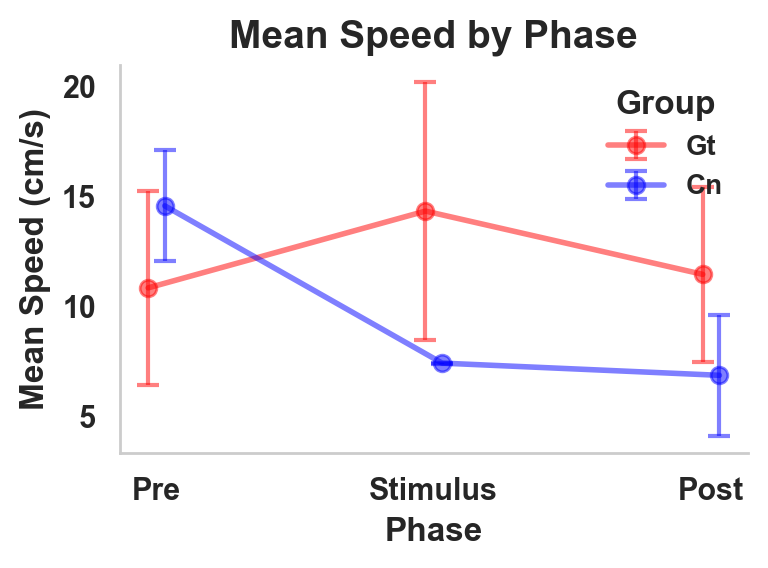

                       sum_sq    df         F    PR(>F)
C(group)            34.537606   1.0  0.564628  0.464029
C(Phase)            31.273614   2.0  0.255634  0.777732
C(group):C(Phase)  107.363816   2.0  0.877603  0.436075
Residual           917.532058  15.0       NaN       NaN


In [103]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from scipy.stats import sem  # For standard error calculation

# Add 'group' column based on 'file_name'
delta_df['group'] = delta_df['file_name'].apply(lambda x: 'Gt' if 'Gt' in x else ('Cn' if 'Cn' in x else 'Other'))

# Reshape the data for easier plotting (melt the speed phases into a single column)
speed_df_melted = pd.melt(delta_df, id_vars=['file_name', 'group'], 
                          value_vars=['speed_pre', 'speed_stim', 'speed_post'], 
                          var_name='Phase', value_name='Speed')

# Rename the phases for better readability and set order for the Phase column
speed_df_melted['Phase'] = pd.Categorical(
    speed_df_melted['Phase'].replace({
        'speed_pre': 'Pre',
        'speed_stim': 'Stimulus',
        'speed_post': 'Post'
    }),
    categories=['Pre', 'Stimulus', 'Post'],
    ordered=True
)

# Compute mean and standard error for each phase and group
plot_data = speed_df_melted.groupby(['Phase', 'group']).agg(
    mean_speed=('Speed', 'mean'),
    sem_speed=('Speed', sem)
).reset_index()

# Plot line chart with error bars for each group across phases
def plot_speed_by_group_with_error_bars(plot_data):
    plt.figure(figsize=(4, 3), dpi=200)
    
    # Define custom color palette
    custom_palette = {'Gt': 'red', 'Cn': 'blue'}
    offset = {'Gt': -0.03, 'Cn': 0.03}  # Offset to avoid overlap
    
    # Plot each group separately with error bars and slight horizontal shift
    for group, color in custom_palette.items():
        group_data = plot_data[plot_data['group'] == group]
        plt.errorbar(
            [i + offset[group] for i in range(len(group_data['Phase']))],  # Apply offset to x-axis
            group_data['mean_speed'], 
            yerr=group_data['sem_speed'], fmt='-o', color=color, 
            label=group, capsize=4, capthick=1.5, elinewidth=1.5, markersize=6, alpha=0.5
        )

    # Add labels, title, and formatting
    plt.xticks(range(len(plot_data['Phase'].unique())), plot_data['Phase'].unique(), fontsize=11)
    plt.xlabel('Phase', fontsize=12, fontweight='bold')
    plt.ylabel('Mean Speed (cm/s)', fontsize=12, fontweight='bold')
    plt.title('Mean Speed by Phase', fontsize=14, fontweight='bold')
    plt.yticks(fontsize=11)
    
    # Add legend
    plt.legend(title='Group', title_fontsize='12', fontsize=10, loc='best')

    # Remove grid for a cleaner look
    plt.grid(False)

    # Show plot
    plt.tight_layout()
    plt.show()

# Call the function to plot the data
plot_speed_by_group_with_error_bars(plot_data)

# Perform two-way ANOVA
def run_anova_speed(speed_df_melted):
    # Fit the model with group and phase as factors
    model = ols('Speed ~ C(group) * C(Phase)', data=speed_df_melted).fit()
    
    # Perform two-way ANOVA
    anova_results = anova_lm(model, typ=2)
    
    # Print the ANOVA table
    print(anova_results)

# Call the function to perform the ANOVA
run_anova_speed(speed_df_melted)

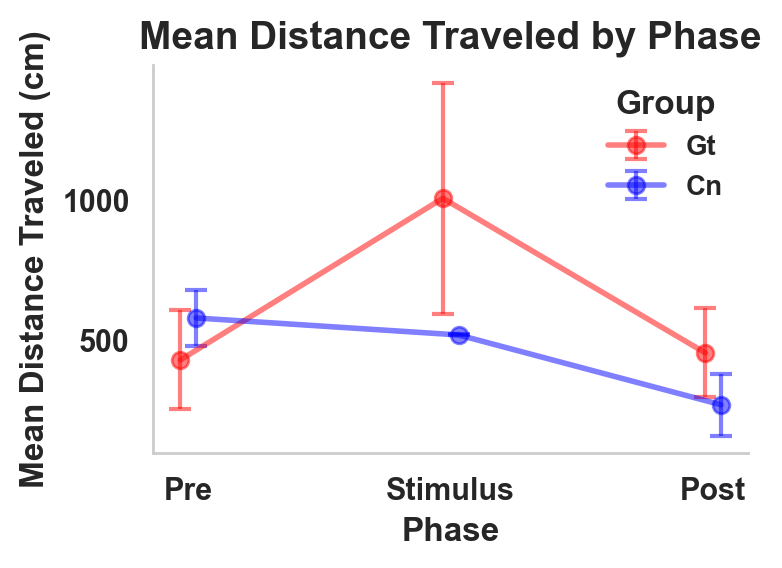

                         sum_sq    df         F    PR(>F)
C(group)           1.552461e+05   1.0  0.822276  0.378852
C(Phase)           6.571611e+05   2.0  1.740360  0.209071
C(group):C(Phase)  3.452708e+05   2.0  0.914381  0.421981
Residual           2.832005e+06  15.0       NaN       NaN


In [104]:
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import sem  # For standard error calculation
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# Add 'group' column based on 'file_name'
delta_df['group'] = delta_df['file_name'].apply(lambda x: 'Gt' if 'Gt' in x else ('Cn' if 'Cn' in x else 'Other'))

# Reshape the data for easier plotting (melt the distance phases into a single column)
distance_df_melted = pd.melt(delta_df, id_vars=['file_name', 'group'], 
                             value_vars=['distance_pre_phase', 'distance_stimulus_phase', 'distance_post_phase'], 
                             var_name='Phase', value_name='Distance')

# Rename the phases for better readability and set order for the Phase column
distance_df_melted['Phase'] = pd.Categorical(
    distance_df_melted['Phase'].replace({
        'distance_pre_phase': 'Pre',
        'distance_stimulus_phase': 'Stimulus',
        'distance_post_phase': 'Post'
    }),
    categories=['Pre', 'Stimulus', 'Post'],
    ordered=True
)

# Compute mean and standard error for each phase and group
plot_data = distance_df_melted.groupby(['Phase', 'group']).agg(
    mean_distance=('Distance', 'mean'),
    sem_distance=('Distance', sem)
).reset_index()

# Plot line chart with error bars for each group across phases
def plot_distance_by_group_with_error_bars(plot_data):
    plt.figure(figsize=(4,3), dpi=200)
    
    # Define custom color palette
    custom_palette = {'Gt': 'red', 'Cn': 'blue'}
    offset = {'Gt': -0.03, 'Cn': 0.03}  # Offset to avoid overlap
    
    # Plot each group separately with error bars and slight horizontal shift
    for group, color in custom_palette.items():
        group_data = plot_data[plot_data['group'] == group]
        plt.errorbar(
            [i + offset[group] for i in range(len(group_data['Phase']))],  # Apply offset to x-axis
            group_data['mean_distance'], 
            yerr=group_data['sem_distance'], fmt='-o', color=color, 
            label=group, capsize=4, capthick=1.5, elinewidth=1.5, markersize=6, alpha=0.5
        )

    # Add labels, title, and formatting
    plt.xticks(range(len(plot_data['Phase'].unique())), plot_data['Phase'].unique(), fontsize=11)
    plt.xlabel('Phase', fontsize=12, fontweight='bold')
    plt.ylabel('Mean Distance Traveled (cm)', fontsize=12, fontweight='bold')
    plt.title('Mean Distance Traveled by Phase', fontsize=14, fontweight='bold')
    plt.yticks(fontsize=11)
    
    # Add legend
    plt.legend(title='Group', title_fontsize='12', fontsize=10, loc='best')

    # Remove grid for a cleaner look
    plt.grid(False)

    # Show plot
    plt.tight_layout()
    plt.show()

# Call the function to plot the data
plot_distance_by_group_with_error_bars(plot_data)

# Perform two-way ANOVA
def run_anova_distance(distance_df_melted):
    # Fit the model with group and phase as factors
    model = ols('Distance ~ C(group) * C(Phase)', data=distance_df_melted).fit()
    
    # Perform two-way ANOVA
    anova_results = anova_lm(model, typ=2)
    
    # Print the ANOVA table
    print(anova_results)

# Call the function to perform the ANOVA
run_anova_distance(distance_df_melted)